In [47]:
import os
import pickle
import pandas as pd
import numpy as np
import netbone as nb
import networkx as nx
import matplotlib.pyplot as plt
import networkx.algorithms.community as nx_comm
from cdlib import algorithms
from cdlib.evaluation import variation_of_information, surprise, newman_girvan_modularity

from netbone.filters import threshold_filter, fraction_filter
from netbone.compare import Compare
from netbone.measures import node_fraction, edge_fraction, weight_entropy, average_degree, lcc_size
from netbone.visualize import plot_radar, plot_progression

from tqdm import tqdm
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error, r2_score

import os
import time
import pickle
import pandas as pd
import numpy as np
import netbone as nb
import networkx as nx
import plotly.express as px
import matplotlib.pyplot as plt
import networkx.algorithms.community as nx_comm

from netbone.filters import threshold_filter, fraction_filter
from netbone.compare import Compare
from netbone.measures import node_fraction, edge_fraction, weight_entropy, average_degree, lcc_size
from netbone.visualize import plot_radar, plot_progression

from tqdm import tqdm
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error, r2_score

from metrics import coalition, fragmentation, isolation

pd.options.display.float_format = '{:.2f}'.format

import seaborn as sns
plt.style.use('bmh')

## Backbone Extraction

In [2]:
def contextual_metrics(G, Gb, test_set, metadata_to_use=None, cat_features=['p1', 'p2']):
    idx = ['n1', 'n2', 'weight']
    df = pd.DataFrame()
    
    if len(Gb.nodes()) == 0 or len(Gb.edges()) == 0:
        return -1, -1
    
    for edge in [i for i in Gb.edges(data=True)]:
        edge[2]['n1'] = edge[0]
        edge[2]['n2'] = edge[1]

        edge[2]['p1'] = G.nodes[edge[0]]['partido']
        edge[2]['p2'] = G.nodes[edge[1]]['partido']

        df = pd.concat([df, pd.DataFrame([edge[2]])], ignore_index=True)

    df['p1'] = df['p1'].astype('object')
    df['p2'] = df['p2'].astype('object')
    
    partidos = []
    for node in G.nodes(data=True):
        partidos.append(node[1]['partido'])

    partidos = pd.DataFrame(pd.DataFrame(partidos, columns=['partido'])['partido'].value_counts(normalize=True), columns=['partido']).reset_index()

    df = df.merge(partidos, how='left', left_on=['p1'], right_on='index').drop(columns=['index']).rename(columns={'partido': 'prevalence_party_1'})
    df = df.merge(partidos, how='left', left_on=['p2'], right_on='index').drop(columns=['index']).rename(columns={'partido': 'prevalence_party_2'})
        
    if metadata_to_use is not None:
        df = df[metadata_to_use + idx]
        
    df = df.drop_duplicates()
    df['edge_id'] = df['n1'].astype(str) + '_' + df['n2'].astype(str)
    
    for cat_feat in cat_features:
        df[cat_feat] = df[cat_feat].astype('category')
    
    train_set = df[~df['edge_id'].isin(test_set)]
    test_set = df[df['edge_id'].isin(test_set)]
    
    train_set.drop(columns=['n1', 'n2'], inplace=True)
    train_set.set_index(['edge_id'], inplace=True)
    test_set.drop(columns=['n1', 'n2'], inplace=True)
    test_set.set_index(['edge_id'], inplace=True)
    
    if len(train_set) < 3 or len(test_set) < 3:
        return -1, -1
    
    try:
        xgb = XGBRegressor(tree_method='hist', enable_categorical=True)

        param_grid = {
           'n_estimators': [10, 50, 100, 500],
           'max_depth': [2, 5, None],
           'max_leaves': [0, 3, 5],
           'learning_rate': [1e-6, 1e-3],
           'reg_alpha':[1e-3, 1e3],
           'reg_lambda':[1e-3, 1e3],
           'enable_categorical': [True]
        }

        clf = GridSearchCV(estimator=xgb, cv=3, param_grid=param_grid, n_jobs=6)
        clf.fit(train_set.drop(columns=['weight']), train_set['weight'])

        preds = clf.predict(test_set.drop(columns=['weight']))

        r2 = r2_score(test_set['weight'], preds)
        mse = mean_squared_error(test_set['weight'], preds)

        return r2, mse
    except Exception as e:
        print(e)
        return -1, -1

In [3]:
def density(original, backbone):
    return round(nx.density(backbone), 4)

def transitivity(original, backbone):
    return nx.transitivity(backbone)

def fraction_of_edges(original, backbone):
    return len(backbone.edges()) / len(original.edges())

def fraction_of_nodes(original, backbone):
    print(original.nodes())
    return len(backbone.nodes()) / len(original.nodes())

def clustering_coefficient(original, backbone):
    return nx.average_clustering(backbone)

def leiden_modularity(original, backbone):
    try:
        G_part = algorithms.leiden(backbone)
    except Exception:
        return 0
    G_mod = newman_girvan_modularity(backbone, G_part)
    G_surprise = surprise(backbone, G_part)
    
    return G_mod.score

def leiden_surprise(original, backbone):
    try:
        G_part = algorithms.leiden(backbone)
    except Exception:
        return 0
    G_mod = newman_girvan_modularity(backbone, G_part)
    G_surprise = surprise(backbone, G_part)
    
    return G_surprise.score

def louvain_communities(original, backbone):
    try:
        G_part = algorithms.louvain(backbone)
    except Exception:
        return -1
    
    return len(G_part.communities)

def leiden_communities(original, backbone):
    try:
        G_part = algorithms.leiden(backbone)
    except Exception:
        return -1
    
    return len(G_part.communities)

def surprise_communities(original, backbone):
    try:
        G_part = algorithms.surprise_communities(backbone)
    except Exception:
        return -1
    
    return len(G_part.communities)

def louvain_modularity(original, backbone):
    try:
        G_part = algorithms.louvain(backbone)
    except Exception:
        return 0
    G_mod = newman_girvan_modularity(backbone, G_part)
    G_surprise = surprise(backbone, G_part)
    
    return G_mod.score

def louvain_surprise(original, backbone):
    try:
        G_part = algorithms.louvain(backbone)
    except Exception:
        return 0
    G_mod = newman_girvan_modularity(backbone, G_part)
    G_surprise = surprise(backbone, G_part)
    
    return G_surprise.score

def surprise_communities_modularity(original, backbone):
    try:
        G_part = algorithms.surprise_communities(backbone)
    except Exception:
        return 0
    G_mod = newman_girvan_modularity(backbone, G_part)
    G_surprise = surprise(backbone, G_part)
    
    return G_mod.score

def surprise_communities_surprise(original, backbone):
    try:
        G_part = algorithms.surprise_communities(backbone)
    except Exception:
        return 0
    G_mod = newman_girvan_modularity(backbone, G_part)
    G_surprise = surprise(backbone, G_part)
    
    return G_surprise.score

def louvain_leiden_VI(original, backbone):
    try:
        G_part_louvain = algorithms.louvain(backbone)
        G_part_leiden = algorithms.leiden(backbone)
    except Exception:
        return -1

    return variation_of_information(G_part_louvain, G_part_leiden).score

def louvain_surprise_VI(original, backbone):
    try:
        G_part_louvain = algorithms.louvain(backbone)
        G_part_surprise = algorithms.surprise_communities(backbone)
    except Exception:
        return -1

    return variation_of_information(G_part_louvain, G_part_surprise).score

def leiden_surprise_VI(original, backbone):
    try:
        G_part_leiden = algorithms.leiden(backbone)
        G_part_surprise = algorithms.surprise_communities(backbone)
    except Exception:
        return -1
    return variation_of_information(G_part_leiden, G_part_surprise).score

### Topological Analysis

In [4]:
if not os.path.isfile('all_metrics_v2.csv'):

    years = [i for i in range(2010, 2023)]
    all_results = {}
    for house in ['senate', 'chamber']:
        for year in tqdm(years):
            try:
                with open(f'../../data/processed/voting_networks/graphs/{year}_{house}_voting_equal', 'rb') as fp:
                    G = pickle.load(fp)
                    G = nx.relabel_nodes(G, {i:int(i) for i in G.nodes()})

                Mcc = sorted(nx.connected_components(G), key=len, reverse=True)
                G = G.subgraph(Mcc[0]).copy()

            except Exception as e:
                print(e)
                continue

            fractions = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

            # Contextual Analysis
            dp = nb.disparity(G)
            ln = nb.lans(G)
            hs = nb.high_salience_skeleton(G)
            ds = nb.doubly_stochastic(G)
            nc = nb.noise_corrected(G)

            framework = Compare()
            framework.set_network(G)
            framework.set_filter(fraction_filter, fractions)

            framework.add_backbone(dp)
            framework.add_backbone(ln)
            framework.add_backbone(hs)
            framework.add_backbone(ds)
            framework.add_backbone(nc)

            framework.add_property("Node Fraction", node_fraction)
            framework.add_property("Weight Entropy", weight_entropy)
            framework.add_property("Average Degree", average_degree)
            framework.add_property("LCC Size", lcc_size)
            framework.add_property("Density", density)
            framework.add_property("Transitivity", transitivity)
            framework.add_property("Clustering Coefficient", clustering_coefficient)
            
            framework.add_property("Louvain Communities", louvain_communities)
            framework.add_property("Leiden Communities", leiden_communities)
            framework.add_property("Surprise Communities", surprise_communities)

            framework.add_property("Louvain Modularity", louvain_modularity)
            framework.add_property("Leiden Modularity", leiden_modularity)
            framework.add_property("Surprise Modularity", surprise_communities_modularity)

            framework.add_property("Louvain Surprise", louvain_surprise)
            framework.add_property("Leiden Surprise", leiden_surprise)
            framework.add_property("Surprise Surprise", surprise_communities_surprise)

            framework.add_property("Louvain-Leiden VI", louvain_leiden_VI)
            framework.add_property("Louvain-Surprise VI", louvain_surprise_VI)
            framework.add_property("Leiden-Surprise VI", leiden_surprise_VI)

            results = framework.properties_progression()
            all_results[f'{house}_{year}'] = results
            plot_progression(results, f'{house}_{year}')

    all_metrics = pd.DataFrame()

    for key in all_results:
        metrics = pd.DataFrame()
        i = 0
        for metric in all_results[key]:
            aux = all_results[key][metric].reset_index()
            aux['house'] = key.split('_')[0]
            aux['year'] = int(key.split('_')[1])

            aux = aux.melt(
                id_vars=['Fraction of Edges', 'house', 'year'],
                value_vars=['Disparity Filter', 'Locally Adaptive Network Sparsification Filter', 'High Salience Skeleton Filter', 'Doubly Stochastic Filter', 'Noise Corrected Filter'],
                var_name='method',
                value_name=metric).rename(columns={'Fraction of Edges': 'fraction'})

            if i == 0:
                metrics = pd.concat([metrics, aux])
                i = 1
            else:
                metrics = metrics.merge(aux, on=['fraction', 'house', 'year', 'method'], how='outer')

        all_metrics = pd.concat([all_metrics, metrics])

        all_metrics.to_csv('all_metrics_v2.csv', sep=';')

In [5]:
all_metrics = pd.read_csv('all_metrics_v2.csv', sep=';')

### Contextual Analysis

In [6]:
if not os.path.isfile('contextual_metrics_v2.csv'):
    
    years = [i for i in range(2010, 2023)]

    final = pd.DataFrame()

    for house in ['senate', 'chamber']:
        for year in tqdm(years):
            try:
                with open(f'../../data/processed/voting_networks/graphs/{year}_{house}_voting_equal', 'rb') as fp:
                    G = pickle.load(fp)

                Mcc = sorted(nx.connected_components(G), key=len, reverse=True)
                G = G.subgraph(Mcc[0]).copy()

            except Exception as e:
                print(e)
                continue

            dp = nb.disparity(G)
            ln = nb.lans(G)
            hs = nb.high_salience_skeleton(G)
            ds = nb.doubly_stochastic(G)
            nc = nb.noise_corrected(G)

            methods = [dp, ln, hs, ds, nc]

            fractions = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

            for fraction in tqdm(fractions):
                # Contextual Analysis
                # Test Set Definition
                sets = []
                for method in tqdm(methods):
                    Gb = fraction_filter(method, fraction, narrate=False)
                    aux = pd.DataFrame(Gb.edges(), columns=['source', 'target'])
                    aux['edge_id'] = aux['source'].astype(str) + '_' + aux['target'].astype(str)

                    sets.append(set(aux['edge_id']))

                test_set = set.intersection(*sets)

                for name, method in zip(['disparity_filter', 'lans', 'high_salience_skeleton', 'doubly_stochastic', 'noise_corrected'], methods):
                    Gb = fraction_filter(method, fraction, narrate=False)

                    r2, mse = contextual_metrics(G, Gb, test_set, metadata_to_use=['p1', 'p2', 'prevalence_party_1', 'prevalence_party_2'])

                    final = pd.concat(
                        [final, pd.DataFrame(
                            [{'year': year, 'house': house, 'fraction': fraction, 'method': name, 'r2': r2, 'mse': mse, 'n_edges': len(Gb.edges()), 'n_nodes': len(Gb.nodes())}]
                        )], ignore_index=True)
                    
    final.to_csv('contextual_metrics_v2.csv', sep=';', index=False)

In [7]:
final = pd.read_csv('contextual_metrics_v2.csv', sep=';')

metrics_map = {
    'disparity_filter': 'Disparity Filter',
    'lans': 'Locally Adaptive Network Sparsification Filter',
    'high_salience_skeleton': 'High Salience Skeleton Filter', 'doubly_stochastic': 'Doubly Stochastic Filter',
    'noise_corrected': 'Noise Corrected Filter'
}

final['method'] = final['method'].map(metrics_map)
df = all_metrics.merge(final, how='outer')

In [8]:
metric_dict = {}
inv_map = {v: k for k, v in metrics_map.items()}

for house in ['senate', 'chamber']:
    aux = df[(df['house'] == house)]

    # Mantemos 80% no LCC
    aux = aux[(aux['LCC Size'] >= aux['n_nodes'].max() * 0.80)].groupby(['fraction', 'year', 'method'], as_index=False).agg(
        {'Node Fraction': 'mean', 'Average Degree': 'mean', 'LCC Size': 'mean', 'LCC Size': 'mean',
         'Density': 'mean', 'Transitivity': 'mean', 'Clustering Coefficient': 'mean', 'Louvain Modularity': 'mean',
         'Leiden Modularity': 'mean', 'Surprise Modularity': 'mean',
         'Louvain Surprise': 'mean', 'Leiden Surprise': 'mean', 'Surprise Surprise': 'mean',
         'r2': 'mean', 'mse': 'mean'}
    ).dropna()
    
    aux = aux[aux['mse'] > 0]
    
    aux['biggest_surprise'] = aux.apply(lambda aux: max(aux['Louvain Surprise'], aux['Leiden Surprise'], aux['Surprise Surprise']), axis=1)
    aux['best_algorithm'] = 'Surprise'
    aux['best_algorithm'] = aux.apply(
        lambda x: 'louvain' if x['Louvain Surprise'] > x['Leiden Surprise'] and x['Louvain Surprise'] > x['Surprise Surprise'] else x['best_algorithm'], axis=1 
    )
    aux['best_algorithm'] = aux.apply(
        lambda x: 'leiden' if x['Leiden Surprise'] > x['Louvain Surprise'] and x['Leiden Surprise'] > x['Surprise Surprise'] else x['best_algorithm'], axis=1 
    )

    for year in df['year'].unique():
        aux2 = aux[aux['year'] == year].sort_values('Leiden Surprise', ascending=False)

        metric_dict[(house, year)] = (inv_map[aux2.iloc[0]['method']], aux2.iloc[0]['fraction'])

In [9]:
pd.set_option('display.max_columns', None)

In [10]:
df[(df['mse'] > 0)&(df['LCC Size'] >= df['n_nodes'].max() * 0.80)].sort_values('Leiden Surprise', ascending=False)

,Unnamed: 0,fraction,house,year,method,Node Fraction,Weight Entropy,Average Degree,LCC Size,Density,Transitivity,Clustering Coefficient,Louvain Communities,Leiden Communities,Surprise Communities,Louvain Modularity,Leiden Modularity,Surprise Modularity,Louvain Surprise,Leiden Surprise,Surprise Surprise,Louvain-Leiden VI,Louvain-Surprise VI,Leiden-Surprise VI,r2,mse,n_edges,n_nodes
1228,28,0.80,chamber,2021,High Salience Skeleton Filter,1.00,16.17,287.90,543,0.53,0.94,0.93,3,3,18,0.20,0.20,0.20,32104.12,33733.57,37861.11,0.07,0.49,0.37,0.13,0.01,78164,543
1198,48,0.80,chamber,2020,Noise Corrected Filter,0.97,16.20,300.93,523,0.58,0.95,0.95,2,2,6,0.19,0.19,0.19,33845.93,33485.50,34879.43,0.04,0.16,0.19,0.07,0.01,78693,523
1178,28,0.80,chamber,2020,High Salience Skeleton Filter,1.00,16.19,291.46,540,0.54,0.93,0.93,2,2,17,0.19,0.19,0.19,33166.13,33166.13,36415.31,0.00,0.37,0.37,0.05,0.01,78693,540
1248,48,0.80,chamber,2021,Noise Corrected Filter,0.96,16.18,300.05,521,0.58,0.95,0.95,3,2,7,0.20,0.20,0.20,31385.36,33110.51,35048.21,0.16,0.26,0.20,0.17,0.01,78164,521
1197,47,0.70,chamber,2020,Noise Corrected Filter,0.96,16.03,266.89,516,0.52,0.93,0.93,2,3,16,0.20,0.20,0.20,32920.75,32879.52,35350.78,0.03,0.33,0.34,-0.10,0.01,68857,516
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
859,9,0.90,chamber,2014,Disparity Filter,1.00,16.82,482.53,555,0.87,0.90,0.91,3,2,14,0.09,0.09,0.02,340.11,499.71,1264.96,1.41,2.24,1.85,-1.13,0.03,133903,555
869,19,0.90,chamber,2014,Locally Adaptive Network Sparsification Filter,1.00,16.82,482.53,555,0.87,0.90,0.90,3,2,15,0.09,0.08,0.01,340.44,486.77,1048.87,1.37,2.07,1.96,-1.00,0.02,133903,555
898,48,0.80,chamber,2014,Noise Corrected Filter,0.98,16.72,439.21,542,0.81,0.89,0.91,3,2,30,0.09,0.09,0.00,408.49,452.34,5346.28,1.53,2.13,1.87,-0.94,0.02,119025,542
879,29,0.90,chamber,2014,High Salience Skeleton Filter,1.00,16.84,482.53,555,0.87,0.93,0.93,3,2,17,0.09,0.08,0.00,157.36,226.14,3529.61,1.78,1.93,1.42,-1.05,0.02,133903,555


In [61]:
methods = df['method'].unique()

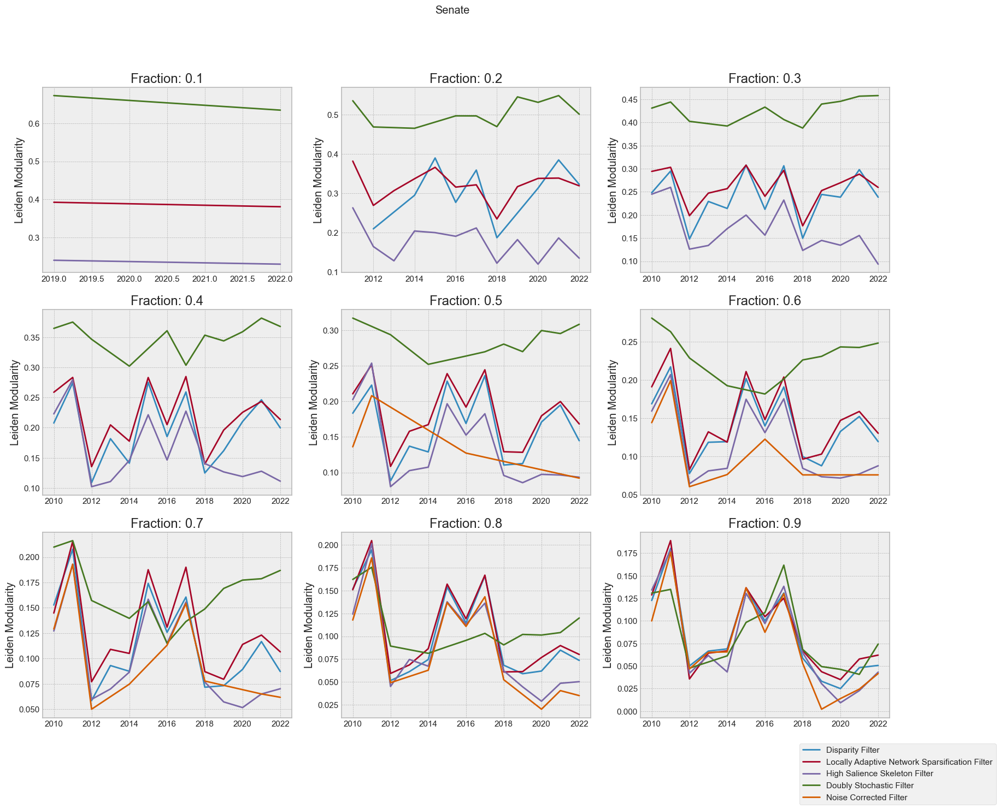

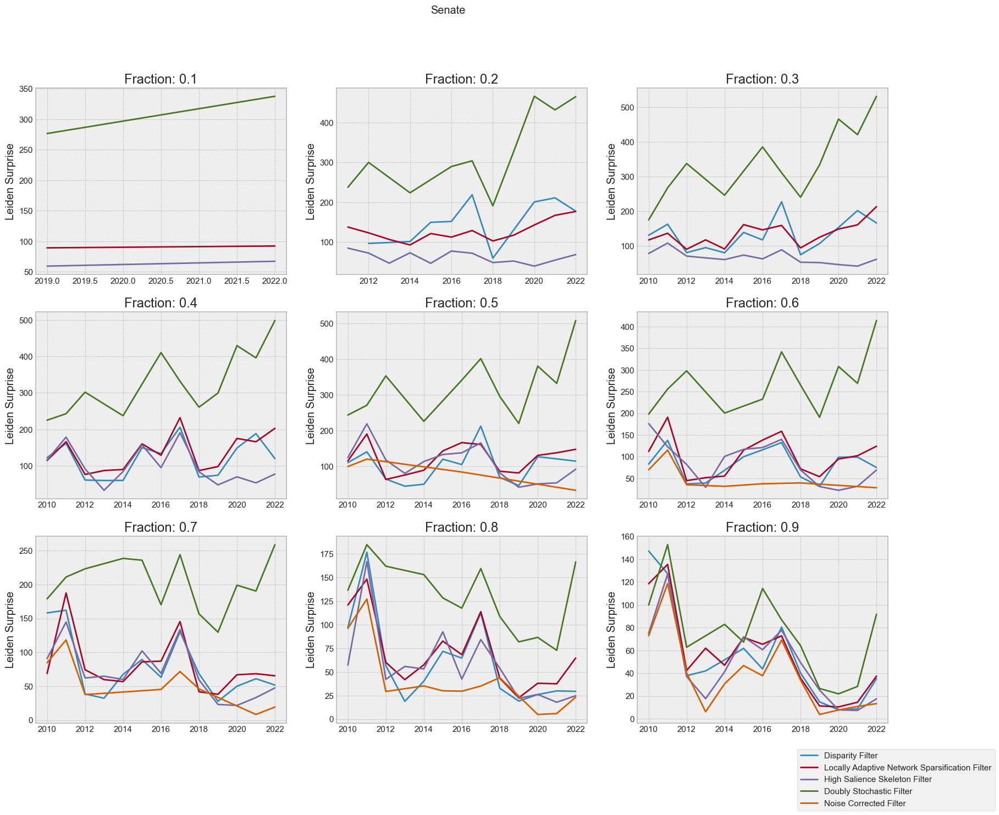

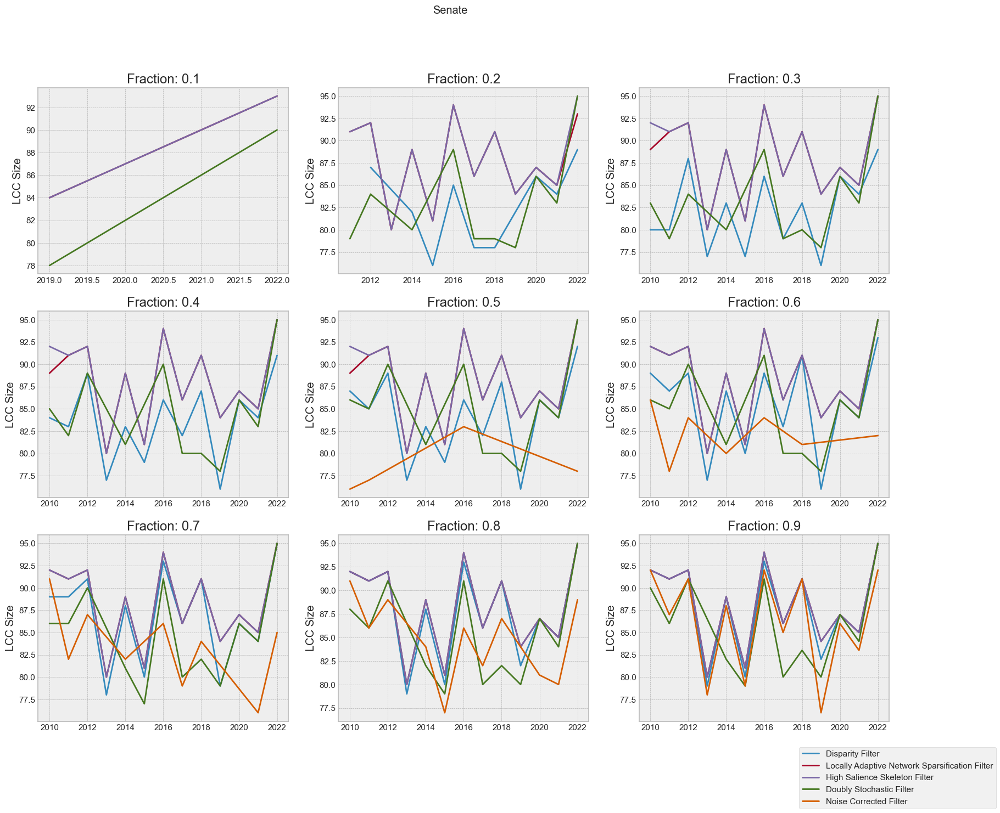

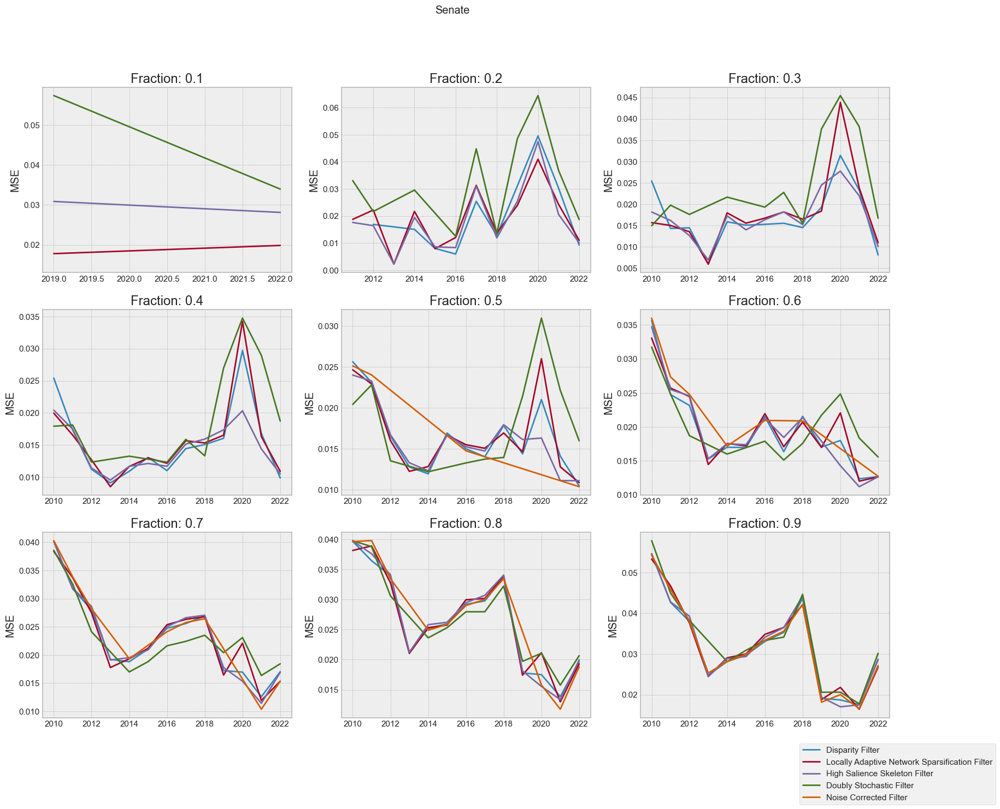

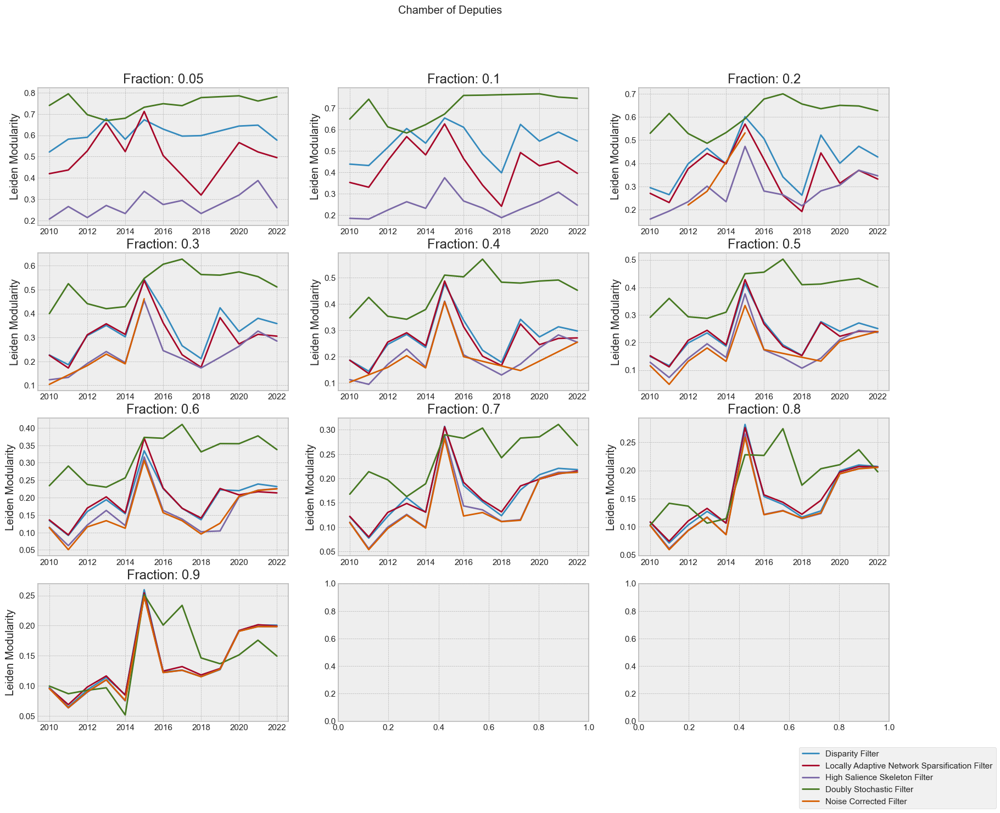

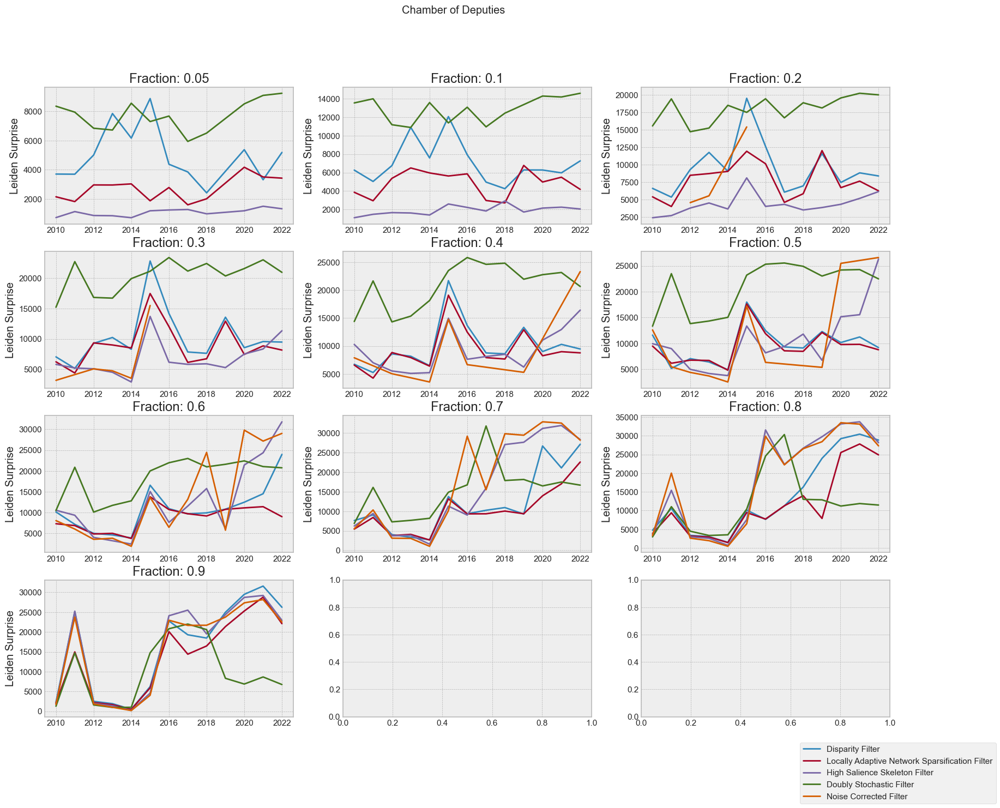

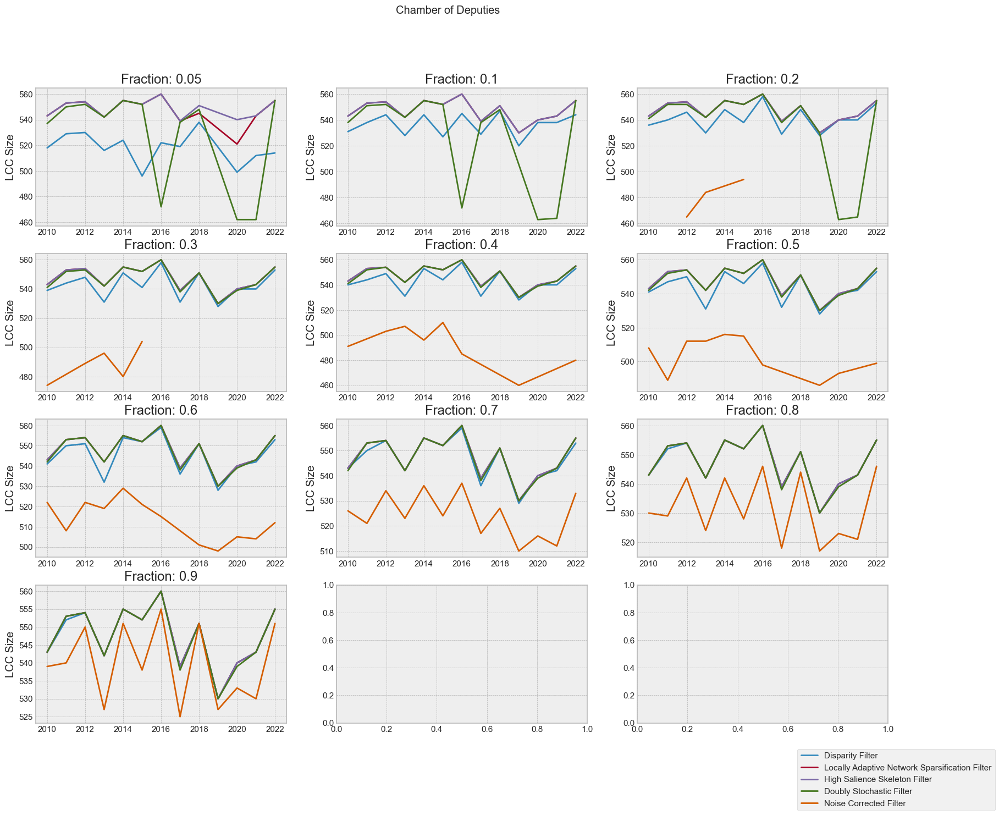

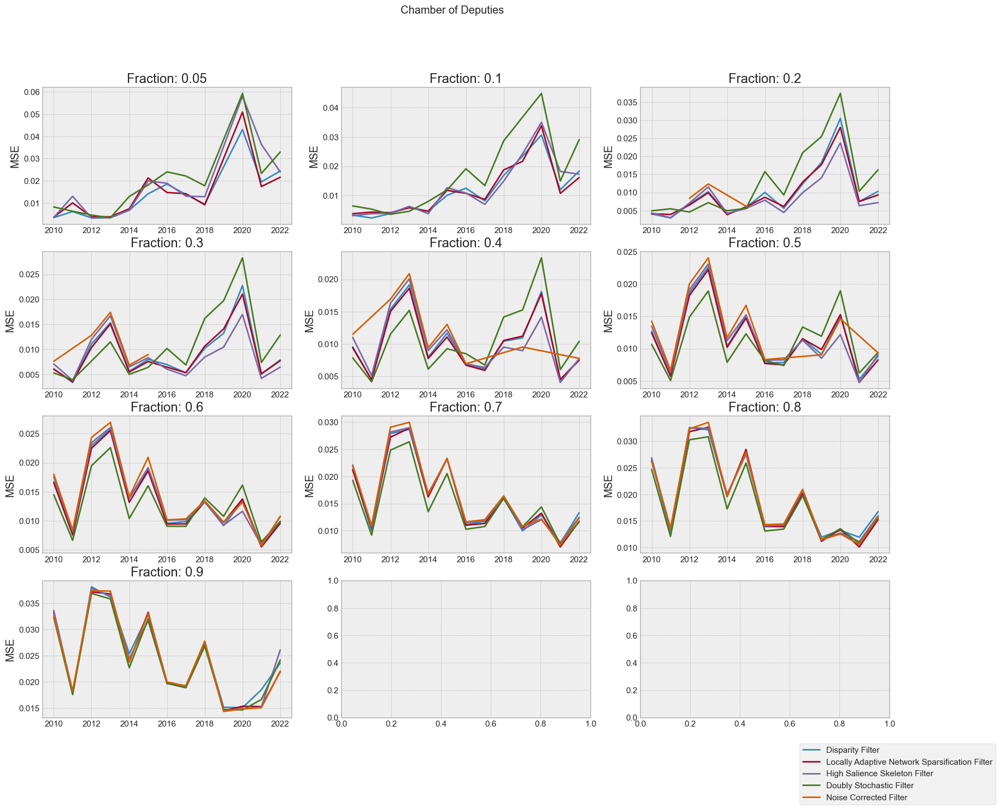

In [62]:
for house in ['senate', 'chamber']:
    if house == 'senate':
        title = 'Senate'
    else:
        title = 'Chamber of Deputies'

    aux = df[(df['house'] == house)]

    aux = aux[aux['mse'] > 0]
    aux = aux[(aux['LCC Size'] >= aux['n_nodes'].max() * 0.80)].groupby(['fraction', 'year', 'method'], as_index=False).agg(
        {'Node Fraction': 'mean', 'Average Degree': 'mean', 'LCC Size': 'mean', 'LCC Size': 'mean',
         'Density': 'mean', 'Transitivity': 'mean', 'Clustering Coefficient': 'mean', 'Leiden Modularity': 'mean',
         'Leiden Surprise': 'mean',
         'r2': 'mean', 'mse': 'mean'}
    ).dropna()

    fractions = aux['fraction'].unique()
    
    if len(fractions) == 9:
        lines = 3
    else:
        lines = 4
        
    for metric in ['Leiden Modularity', 'Leiden Surprise', 'LCC Size', 'mse']:

        fig, axs = plt.subplots(lines, 3, figsize=(20,15))
        axs = axs.flatten()

        for i, fraction in enumerate(fractions):
            for method in methods:
                aux2 = aux[(aux['method'] == method)&(aux['fraction'] == fraction)].sort_values('year')
                axs[i].plot(aux2['year'], aux2[metric])

            if metric == 'mse':
                metric_to_use = 'MSE'
            else:
                metric_to_use = metric
            
            axs[i].set_title(f'Fraction: {fraction}')
            axs[i].set_ylabel(metric_to_use)

        fig.legend(methods, loc='lower right')
        fig.suptitle(title)

PearsonRResult(statistic=-0.11567648584300376, pvalue=0.0032609825425445817)

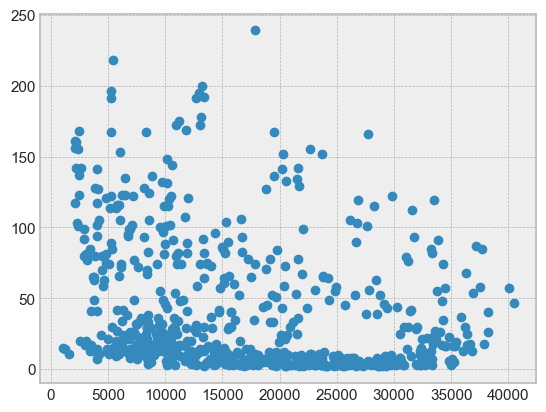

In [63]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

house = 'chamber'

aux = df[df['house'] == house]

plt.plot(aux[aux['mse'] > 0]['Surprise Surprise'], aux[aux['mse'] > 0]['Surprise Communities'], 'o')

pearsonr(aux[aux['mse'] > 0]['Leiden Surprise'], aux[aux['mse'] > 0]['mse'])

In [32]:
df[(df['house'] == 'chamber')&(df['year'] == 2021)&(df['fraction'] == 0.8)]

,Unnamed: 0,fraction,house,year,method,Node Fraction,Weight Entropy,Average Degree,LCC Size,Density,Transitivity,Clustering Coefficient,Louvain Communities,Leiden Communities,Surprise Communities,Louvain Modularity,Leiden Modularity,Surprise Modularity,Louvain Surprise,Leiden Surprise,Surprise Surprise,Louvain-Leiden VI,Louvain-Surprise VI,Leiden-Surprise VI,r2,mse,n_edges,n_nodes
1208,8,0.80,chamber,2021,Disparity Filter,1.00,16.12,287.90,543,0.53,0.87,0.89,3,2,3,0.21,0.21,0.21,30750.25,30433.20,32399.59,0.35,0.39,0.17,0.06,0.01,78164,543
1218,18,0.80,chamber,2021,Locally Adaptive Network Sparsification Filter,1.00,16.11,287.90,543,0.53,0.85,0.88,3,2,3,0.21,0.21,0.20,28244.74,27798.85,29714.60,0.06,0.13,0.17,0.21,0.01,78164,543
1228,28,0.80,chamber,2021,High Salience Skeleton Filter,1.00,16.17,287.90,543,0.53,0.94,0.93,3,3,18,0.20,0.20,0.20,32104.12,33733.57,37861.11,0.07,0.49,0.37,0.13,0.01,78164,543
1238,38,0.80,chamber,2021,Doubly Stochastic Filter,1.00,16.01,279.75,543,0.52,0.85,0.85,3,3,3,0.24,0.24,0.18,12196.09,11871.87,25844.77,0.65,0.94,1.01,0.15,0.01,75952,543
1248,48,0.80,chamber,2021,Noise Corrected Filter,0.96,16.18,300.05,521,0.58,0.95,0.95,3,2,7,0.20,0.20,0.20,31385.36,33110.51,35048.21,0.16,0.26,0.20,0.17,0.01,78164,521


In [12]:
metric_dict

{('senate', 2010): ('doubly_stochastic', 0.5),
 ('senate', 2011): ('doubly_stochastic', 0.5),
 ('senate', 2012): ('doubly_stochastic', 0.5),
 ('senate', 2013): ('lans', 0.3),
 ('senate', 2014): ('doubly_stochastic', 0.3),
 ('senate', 2015): ('doubly_stochastic', 0.7),
 ('senate', 2016): ('doubly_stochastic', 0.4),
 ('senate', 2017): ('doubly_stochastic', 0.5),
 ('senate', 2018): ('doubly_stochastic', 0.5),
 ('senate', 2019): ('doubly_stochastic', 0.3),
 ('senate', 2020): ('doubly_stochastic', 0.3),
 ('senate', 2021): ('doubly_stochastic', 0.2),
 ('senate', 2022): ('doubly_stochastic', 0.3),
 ('chamber', 2010): ('doubly_stochastic', 0.2),
 ('chamber', 2011): ('high_salience_skeleton', 0.9),
 ('chamber', 2012): ('doubly_stochastic', 0.3),
 ('chamber', 2013): ('doubly_stochastic', 0.3),
 ('chamber', 2014): ('doubly_stochastic', 0.3),
 ('chamber', 2015): ('doubly_stochastic', 0.4),
 ('chamber', 2016): ('high_salience_skeleton', 0.8),
 ('chamber', 2017): ('doubly_stochastic', 0.7),
 ('chamb

## General Analysis

In [13]:
parties_historical_dict = {'AVANTE': {'outros_nomes': ['PTdoB'], 'alinhamento': 'center'},
 'CIDADANIA': {'outros_nomes': ['PPS', 'PCB'], 'alinhamento': 'center-left'},
 'DC': {'outros_nomes': ['PSDC'], 'alinhamento': 'center-right'},
 'DEM': {'outros_nomes': ['PFL'], 'alinhamento': 'center-right'},
 'MDB': {'outros_nomes': ['PMDB'], 'alinhamento': 'center'},
 'NOVO': {'outros_nomes': [], 'alinhamento': 'right'},
 'PATRI': {'outros_nomes': ['PATRIOTA', 'PEN'], 'alinhamento': 'right'},
 'PCdoB': {'outros_nomes': [], 'alinhamento': 'left'},
 'PDT': {'outros_nomes': [], 'alinhamento': 'center-left'},
 'PHS': {'outros_nomes': [], 'alinhamento': 'center-right'},
 'PODEMOS': {'outros_nomes': ['PTN', 'PODE'], 'alinhamento': 'center-right'},
 'PL': {'outros_nomes': ['PR'], 'alinhamento': 'right'},
 'PMB': {'outros_nomes': [], 'alinhamento': 'center-right'},
 'PMN': {'outros_nomes': [], 'alinhamento': 'center-left'},
 'PP': {'outros_nomes': ['PPB'], 'alinhamento': 'center-right'},
 'PPL': {'outros_nomes': [], 'alinhamento': 'left'},
 'REPUBLICANOS': {'outros_nomes': ['PRB', 'PMR'], 'alinhamento': 'right'},
 'PROS': {'outros_nomes': [], 'alinhamento': 'center'},
 'PRP': {'outros_nomes': [], 'alinhamento': 'right'},
 'PRTB': {'outros_nomes': [], 'alinhamento': 'right'},
 'PSB': {'outros_nomes': [], 'alinhamento': 'left'},
 'PSC': {'outros_nomes': [], 'alinhamento': 'right'},
 'PSD': {'outros_nomes': [], 'alinhamento': 'center'},
 'PSDB': {'outros_nomes': [], 'alinhamento': 'center'},
 'PSL': {'outros_nomes': [], 'alinhamento': 'right'},
 'PSOL': {'outros_nomes': [], 'alinhamento': 'left'},
 'PT': {'outros_nomes': [], 'alinhamento': 'left'},
 'PTB': {'outros_nomes': [], 'alinhamento': 'right'},
 'PTC': {'outros_nomes': [], 'alinhamento': 'center'},
 'PV': {'outros_nomes': [], 'alinhamento': 'center-left'},
 'REDE': {'outros_nomes': [], 'alinhamento': 'left'},
 'S.PART.': {'outros_nomes': ['S/Partido'], 'alinhamento': 'NA'},
 'SOLIDARIEDADE': {'outros_nomes': ['SD', 'SDD'], 'alinhamento': 'center-left'},
}

alinhamento = pd.DataFrame()

for partido in parties_historical_dict:
    alinhamento = alinhamento.append({'community_1': partido, 'alinhamento': parties_historical_dict[partido]['alinhamento']}, ignore_index=True)

In [14]:
def read_graphs(house='senate', method='equal'):
    graphs = {}
    for year in tqdm([i for i in range(2010, 2022)]):
        with open(f'../../data/processed/voting_networks/graphs/{year}_{house}_voting_{method}', 'rb') as fp:
            G = pickle.load(fp)

        graphs[year] = G
        
    return graphs

In [15]:
def apply_backbone_extraction(graphs, house='chamber', mapping_dict={}):
    backboned = {}
    for year in tqdm(graphs):
        G = graphs[year]
        
        methods = {
            'disparity_filter': nb.disparity,
            'lans': nb.lans,
            'high_salience_skeleton': nb.high_salience_skeleton,
            'doubly_stochastic': nb.doubly_stochastic,
            'noise_corrected': nb.noise_corrected,
        }
        
        method, fraction = mapping_dict[(house, year)][0], mapping_dict[(house, year)][1]
        
        M = fraction_filter(methods[method](G), fraction, narrate=False)
        
        nx.set_node_attributes(M, dict(G.nodes(data=True)))
        
        # Get only the biggest connected component
        Mcc = sorted(nx.connected_components(M), key=len, reverse=True)
        try:
            M = M.subgraph(Mcc[0])
        except Exception as e:
            print(e)
        
        backboned[year] = M
        
    return backboned

def change_from_similarity_to_distance(graphs):
    for year in tqdm(graphs):
        G = graphs[year]
        distances = {(e[0], e[1]): {'distance': 2 * np.sqrt((1 - e[2]['weight'])), 'weight': e[2]['weight']} for e in G.edges(data=True)}
        nx.set_edge_attributes(G, distances)
        graphs[year] = G
        
    return graphs

def apply_community_detection(graphs, backboned, algorithm='louvain'):
    communities = {}
    for year in tqdm(graphs):

        G_part, G_mod, G_surp = community_detection(graphs[year], algorithm=algorithm)
        M_part, M_mod, M_surp = community_detection(backboned[year], algorithm=algorithm)

        communities[year] = {'original': {'modularity': G_mod, 'surprise': G_surp, 'partition': G_part},
                             'backbone': {'modularity': M_mod, 'surprise': M_surp, 'partition': M_part}
                            }
        
    return communities

def add_communities(G, G_part):
    n_comm = len(G_part)
    
    communities_dict = {}
    for comm in range(n_comm):
        communities_dict.update({node:comm for node in G_part[comm]})

    nx.set_node_attributes(G, communities_dict, 'community')
    
    return G, communities_dict

def apply_metrics(graphs, backboned, type_='backboned', att='partido', house='chamber'):
    if type_ == 'original':
        dict_ = graphs
    elif type_ == 'backboned':
        dict_ = backboned

    metrics_parties = pd.DataFrame()
    metrics_pairs = pd.DataFrame()

    for year in tqdm(dict_):
        Mcc = sorted(nx.connected_components(dict_[year]), key=len, reverse=True)
        dict_[year] = dict_[year].subgraph(Mcc[0])
        
        shortest_paths = dict(nx.shortest_path_length(dict_[year]), weight='distance')
        
        partidos = np.unique([i[1][att] for i in dict_[year].nodes(data=True)])
        
        calculated_partido_1 = []

        for partido_1 in partidos:
            
            other_com = set(partidos) - set([partido_1])
            isol = isolation(partido_1, dict_[year], other_com, att=att, shortest_paths=shortest_paths)
            frag = fragmentation(partido_1, dict_[year], att=att, shortest_paths=shortest_paths)
            
            if partido_1 == 'S/PARTIDO':
                partido_1 = 'SEM_PARTIDO'

            with open(f'../../data/metrics/PLOS/individual_metrics/{year}_{partido_1}_{type_}_{house}.pkl', 'wb') as fp:
                pickle.dump({
                    'community_1': partido_1,
                    'fragmentation': frag,
                    'isolation': isol, 'type': type_, 'year': year,
                    'att': att
                }, fp)
                
            if partido_1 == 'SEM_PARTIDO':
                partido_1 = 'S/PARTIDO'

            calculated_partido_1.append(partido_1)
            
            for partido_2 in partidos:
                if partido_2 in calculated_partido_1:
                    continue
                coal = coalition(partido_1, partido_2, dict_[year], att=att, shortest_paths=shortest_paths)
                
                if partido_2 == 'S/PARTIDO':
                    partido_2 = 'SEM_PARTIDO'
                
                with open(f'../../data/metrics/PLOS/individual_metrics/{year}_{partido_1}_{partido_2}_{type_}_{house}_coalition.pkl', 'wb') as fp:
                    pickle.dump({
                        'community_1': partido_1, 'community_2': partido_2,
                        'coalition': coal, 'type': type_, 'year': year,
                        'att': att
                    }, fp)
                    
def true_diversity(communities, q, types=['original', 'backbone']):
    diversity = {}
    for year in communities:
        aux = []
        for type_ in types:
            S = np.array([len(p) for p in communities[year][type_]['partition']])
            pi = S / np.sum(S)

            if q > 1:
                D_q = (sum(pi**q))**(1 / (1-q))
            else:
                D_q = 1 / np.prod([p**p for p in pi])
                
            aux.append(D_q)

        if 'original' in types:
            diversity[year] = {'original': aux[0],
                               'backbone': aux[1]}
        else:
            diversity[year] = {'backbone': aux[0]}
            
    return diversity

def get_diameters(graphs):
    diameters = []
    for year in tqdm(graphs):
        d = nx.diameter(graphs[year], weight='distance')
        diameters.append(d)
        
    return diameters


def plot_cumulative_plot(graphs):
    important_parties = ['PSD', 'PODEMOS', 'PL','PDT','PTB','PSDB','PT', 'DEM', 'MDB']
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'b', '#d0a82b', '#55BB77', '#6e10d0']
    aux = pd.DataFrame()
    for year in tqdm(graphs):
        G = graphs[year]
        parties = pd.Series([i[1]['partido'] for i in G.nodes(data=True)]).value_counts().sort_values(ascending=True)#.cumsum()
        if year == 2010:
            aux = pd.concat([aux, pd.DataFrame(parties, columns=[year])])
        else:
            aux = aux.merge(pd.DataFrame(parties, columns=[year]), left_index=True, right_index=True, how='outer')
    aux = aux.fillna(0)
    aux = aux.reset_index()
    
    aux.loc[~aux['index'].isin(important_parties), 'index'] = 'Others'
    aux = aux.groupby('index').sum()
    aux = aux.sort_values(2010).cumsum()
    
    parties = [i for i in aux.sort_values(2010, ascending=False).index]
    plt.figure(figsize=(25,12))
    for i, party in enumerate(parties):
        plt.plot(aux.loc[party].index, aux.loc[party].values, label=party, color=colors[i])
    plt.legend(parties)
    plt.legend(loc='upper right',bbox_to_anchor=(1.1, 1.0))

    parties = [i for i in aux.sort_values(2010, ascending=False).index]
    for i, party in enumerate(parties):
        if i == len(parties) - 1:
            y2 = 0
        else:
            y2 = aux.loc[parties[i+1]].values
        plt.fill_between(list(aux.loc[party].index), y1=aux.loc[party].values, y2=y2, label=party, color=colors[i])
        
def plot_community(G, node_dict, ax=None):
    
    def get_cmap(n, name='tab20'):
        '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
        RGB color; the keyword argument name must be a standard mpl colormap name.'''
        return plt.cm.get_cmap(name, n)

    def rgb_to_hex(rgb):
        return '%02x%02x%02x' % rgb
    
    comm = np.unique(list(node_dict.values()))
    community_to_color = {}
    d = get_cmap(len(comm))
    for i in comm:
        hex_ = matplotlib.colors.to_hex(d(i))

        community_to_color[i] = hex_
        
    node_color = {node: community_to_color[community_id] for node, community_id in node_dict.items()}

    Graph(G,
          node_color=node_color, node_edge_width=0, edge_alpha=0.1,
          node_layout='community', node_layout_kwargs=dict(node_to_community=node_dict),
          edge_layout='bundled', edge_layout_kwargs=dict(k=2000),
          ax=ax
    )
    
def generate_network_statistics(graphs):
    statistics = pd.DataFrame()
    for year in tqdm(graphs):
        G = graphs[year]
        N = len(G.nodes())
        M = len(G.edges())
        
        k = np.array(list(dict(G.degree()).values()))
        n_connected = nx.number_connected_components(G)
        avg_clust = nx.average_clustering(G, weight='weight')
        transitivity = nx.transitivity(G)
        assortativity = nx.degree_assortativity_coefficient(G, weight='weight')
        
        statistics = statistics.append({
            'year': year, 'N': N, 'M': M, 'n_connected': n_connected, 'avg_clust': avg_clust,
            'transitivity': transitivity, 'assortativity': assortativity,
            'avg_degree': np.mean(k)
        }, ignore_index=True)
        
    return statistics

In [37]:
# mapping_dict = {
#     ('senate', 2010): ('doubly_stochastic', 0.3),
#     ('senate', 2011): ('doubly_stochastic', 0.2),
#     ('senate', 2012): ('doubly_stochastic', 0.2),
#     ('senate', 2013): ('lans', 0.2),
#     ('senate', 2014): ('doubly_stochastic', 0.2),
#     ('senate', 2015): ('disparity_filter', 0.2),
#     ('senate', 2016): ('doubly_stochastic', 0.2),
#     ('senate', 2017): ('doubly_stochastic', 0.2),
#     ('senate', 2018): ('doubly_stochastic', 0.2),
#     ('senate', 2019): ('doubly_stochastic', 0.1),
#     ('senate', 2020): ('doubly_stochastic', 0.2),
#     ('senate', 2021): ('doubly_stochastic', 0.2),
#     ('senate', 2022): ('doubly_stochastic', 0.1),
#     ('chamber', 2010): ('doubly_stochastic', 0.05),
#     ('chamber', 2011): ('doubly_stochastic', 0.05),
#     ('chamber', 2012): ('doubly_stochastic', 0.05),
#     ('chamber', 2013): ('disparity_filter', 0.05),
#     ('chamber', 2014): ('doubly_stochastic', 0.05),
#     ('chamber', 2015): ('lans', 0.05),
#     ('chamber', 2016): ('doubly_stochastic', 0.1),
#     ('chamber', 2017): ('doubly_stochastic', 0.1),
#     ('chamber', 2018): ('doubly_stochastic', 0.05),
#     ('chamber', 2019): ('doubly_stochastic', 0.2),
#     ('chamber', 2020): ('doubly_stochastic', 0.05),
#     ('chamber', 2021): ('doubly_stochastic', 0.05),
#     ('chamber', 2022): ('doubly_stochastic', 0.05)
# }

In [16]:
mapping_dict = metric_dict

In [17]:
network_type = 'time'

graphs_chamber = read_graphs(house='chamber')
graphs_senate = read_graphs(house='senate')

100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 104.27it/s]


In [18]:
number_of_parties_senate = []
for year in graphs_senate:
    number_of_parties_senate.append(len(np.unique([i[1]['partido'] for i in graphs_senate[year].nodes(data=True)])))
    
number_of_parties_chamber = []
for year in graphs_chamber:
    number_of_parties_chamber.append(len(np.unique([i[1]['partido'] for i in graphs_chamber[year].nodes(data=True)])))

In [19]:
sns.set()

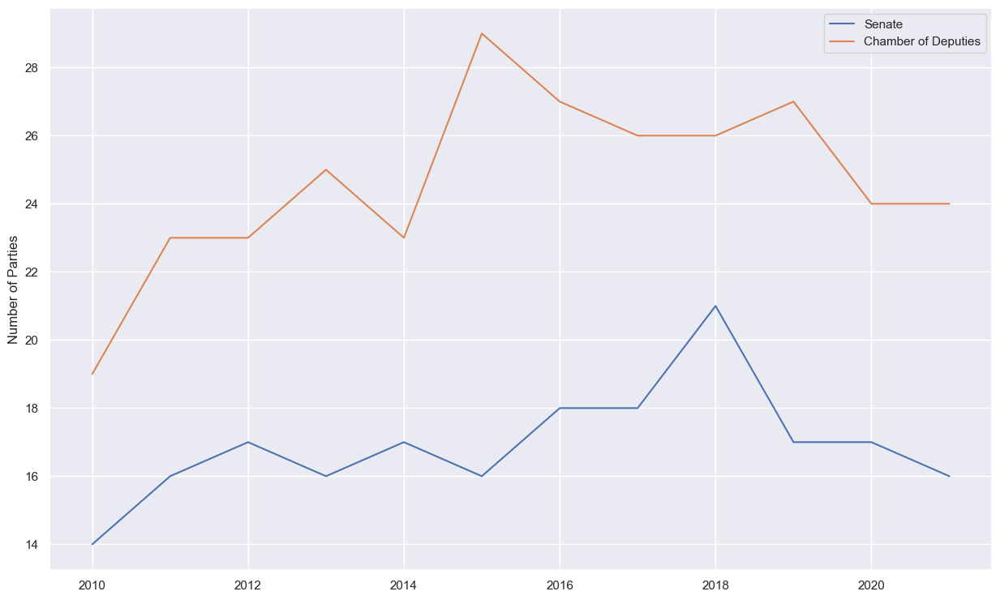

In [20]:
plt.figure(figsize=(15,9))
sns.lineplot(x=[year for year in graphs_senate], y=number_of_parties_senate, label='Senate')
sns.lineplot(x=[year for year in graphs_senate], y=number_of_parties_chamber, label='Chamber of Deputies')
#plt.title('Number of Parties')
plt.ylabel('Number of Parties')
plt.legend()

In [25]:
statistics_senate = generate_network_statistics(graphs_senate)
statistics_senate

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:07<00:00,  1.55it/s]


,year,N,M,n_connected,avg_clust,transitivity,assortativity,avg_degree
0,2010.00,93.00,1135.00,2.00,0.11,0.60,0.13,24.41
1,2011.00,93.00,1550.00,3.00,0.12,0.71,-0.00,33.33
2,2012.00,93.00,2313.00,2.00,0.17,0.78,-0.06,49.74
3,2013.00,85.00,2040.00,6.00,0.17,0.84,-0.15,48.00
4,2014.00,91.00,1706.00,3.00,0.13,0.74,-0.05,37.49
5,2015.00,84.00,2023.00,4.00,0.19,0.83,-0.15,48.17
6,2016.00,96.00,2485.00,3.00,0.15,0.79,-0.10,51.77
7,2017.00,87.00,2283.00,2.00,0.18,0.82,-0.13,52.48
8,2018.00,93.00,1927.00,3.00,0.13,0.74,-0.14,41.44
9,2019.00,86.00,2640.00,3.00,0.26,0.94,-0.01,61.40


In [33]:
statistics_chamber = generate_network_statistics(graphs_chamber)
statistics_chamber

100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [31:24<00:00, 157.07s/it]


,year,N,M,n_connected,avg_clust,transitivity,assortativity,avg_degree
0,2010.00,544.00,129634.00,2.00,0.21,0.93,-0.00,476.60
1,2011.00,554.00,107439.00,2.00,0.32,0.95,0.24,387.87
2,2012.00,555.00,128872.00,2.00,0.18,0.90,0.02,464.40
3,2013.00,543.00,128415.00,2.00,0.18,0.92,0.01,472.98
4,2014.00,556.00,148781.00,2.00,0.23,0.97,-0.04,535.18
5,2015.00,553.00,120084.00,2.00,0.17,0.86,0.00,434.30
6,2016.00,561.00,109447.00,2.00,0.27,0.93,0.17,390.19
7,2017.00,540.00,96836.00,2.00,0.25,0.94,0.20,358.65
8,2018.00,552.00,98222.00,2.00,0.25,0.92,0.21,355.88
9,2019.00,531.00,95684.00,2.00,0.31,0.94,0.30,360.39


In [36]:
for year in tqdm(graphs_senate):
    nx.write_gexf(graphs_senate[year], f"../../data/auxiliar/gephi_files/PLOS/S.O.1_senate_{year}.gexf")
    
for year in tqdm(graphs_chamber):
    nx.write_gexf(graphs_chamber[year], f"../../data/auxiliar/gephi_files/PLOS/S.O.1_chamber_{year}.gexf")

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:27<00:00,  2.25s/it]


In [21]:
party_list = []
for year in graphs_senate:
    party_list.extend(np.unique([i[1]['partido'] for i in graphs_senate[year].nodes(data=True)]))
    party_list.extend(np.unique([i[1]['partido'] for i in graphs_chamber[year].nodes(data=True)]))
    
party_list = np.unique(party_list)

In [22]:
backboned_senate = apply_backbone_extraction(graphs_senate, house='senate', mapping_dict=mapping_dict)

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:17<00:00,  1.47s/it]


In [23]:
backboned_chamber = apply_backbone_extraction(graphs_chamber, house='chamber', mapping_dict=mapping_dict)

100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [41:57<00:00, 209.79s/it]


In [29]:
statistics_senate_backboned = generate_network_statistics(backboned_senate)
statistics_senate_backboned

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 11.32it/s]


,year,N,M,n_connected,avg_clust,transitivity,assortativity,avg_degree
0,2010.00,83.00,288.00,1.00,0.08,0.32,0.51,6.94
1,2011.00,79.00,272.00,1.00,0.10,0.35,0.29,6.89
2,2012.00,84.00,426.00,1.00,0.12,0.42,0.33,10.14
3,2013.00,80.00,408.00,1.00,0.23,0.35,-0.16,10.20
4,2014.00,80.00,282.00,1.00,0.10,0.40,0.57,7.05
5,2015.00,76.00,405.00,1.00,0.25,0.37,-0.29,10.66
6,2016.00,89.00,394.00,1.00,0.14,0.48,0.46,8.85
7,2017.00,79.00,372.00,1.00,0.16,0.49,0.31,9.42
8,2018.00,79.00,316.00,1.00,0.10,0.36,0.39,8.00
9,2019.00,78.00,261.00,1.00,0.20,0.48,0.24,6.69


In [46]:
statistics_chamber_backboned = generate_network_statistics(backboned_chamber)
statistics_chamber_backboned

100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [40:49<00:00, 204.11s/it]


,year,N,M,n_connected,avg_clust,transitivity,assortativity,avg_degree
0,2010.00,541.00,25790.00,1.00,0.19,0.63,0.23,95.34
1,2011.00,553.00,96696.00,1.00,0.35,0.95,0.22,349.71
2,2012.00,553.00,37812.00,1.00,0.18,0.64,0.20,136.75
3,2013.00,542.00,37255.00,1.00,0.17,0.65,0.20,137.47
4,2014.00,555.00,44275.00,1.00,0.21,0.69,0.09,159.55
5,2015.00,552.00,41392.00,1.00,0.22,0.71,0.12,149.97
6,2016.00,560.00,87558.00,1.00,0.33,0.93,0.19,312.71
7,2017.00,538.00,52717.00,1.00,0.25,0.86,0.48,195.97
8,2018.00,527.00,68756.00,1.00,0.34,0.94,0.22,260.93
9,2019.00,530.00,76548.00,1.00,0.36,0.94,0.35,288.86


### Calculating Party Modularity and Surprise

In [24]:
party_dict = {k:i for (i,k) in enumerate(party_list)}

In [25]:
from cdlib import NodeClustering

In [26]:
senate_modularities_parties = []
senate_surprise_parties = []

senate_parties = {}

for year in backboned_senate:
    comms_backbone = []
    for party in party_dict:
        community = [i[0] for i in backboned_senate[year].nodes(data=True) if i[1]['partido'] == party]
        if len(community) == 0:
            continue
        comms_backbone.append(set(community))
    
    senate_modularities_parties.append(newman_girvan_modularity(backboned_senate[year], NodeClustering(comms_backbone, backboned_senate[year])).score)
    senate_surprise_parties.append(surprise(backboned_senate[year], NodeClustering(comms_backbone, backboned_senate[year])).score)
    
    senate_parties[year] = {'backbone': {'partition': comms_backbone}}
    
senate_parties_true_diversity = true_diversity(senate_parties, 1, types=['backbone'])

In [27]:
chamber_modularities_parties = []
chamber_surprise_parties = []

chamber_parties = {}

for year in backboned_chamber:
    comms_backbone = []
    for party in party_dict:
        community = [i[0] for i in backboned_chamber[year].nodes(data=True) if i[1]['partido'] == party]
        if len(community) == 0:
            continue
        comms_backbone.append(set(community))
    
    chamber_modularities_parties.append(newman_girvan_modularity(backboned_chamber[year], NodeClustering(comms_backbone, backboned_senate[year])).score)
    chamber_surprise_parties.append(surprise(backboned_chamber[year], NodeClustering(comms_backbone, backboned_senate[year])).score)
    
    chamber_parties[year] = {'backbone': {'partition': comms_backbone}}
    
chamber_parties_true_diversity = true_diversity(chamber_parties, 1, types=['backbone'])

## Community Detection

In [28]:
%load_ext autoreload
%autoreload 2

In [29]:
from community_detection import community_detection

In [30]:
# ALTERAR ARQUIVO PARA FAZER COMMUNITY DETECTION COM O SURPRISE E SALVAR A SURPRISE NO DICT

communities_senate = apply_community_detection(graphs_senate, backboned_senate, 'leiden')
backboned_senate = change_from_similarity_to_distance(backboned_senate)

100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 133.49it/s]


In [31]:
communities_chamber = apply_community_detection(graphs_chamber, backboned_chamber, 'leiden')
backboned_chamber = change_from_similarity_to_distance(backboned_chamber)

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.91it/s]


In [32]:
senate_communities_true_diversity = true_diversity(communities_senate, 1)
chamber_communities_true_diversity = true_diversity(communities_chamber, 1)

In [33]:
comm_modularity_chamber = [communities_chamber[i]['backbone']['modularity'] for i in communities_chamber]
comm_modularity_senate = [communities_senate[i]['backbone']['modularity'] for i in communities_senate]

comm_surprise_chamber = [communities_chamber[i]['backbone']['surprise'] for i in communities_chamber]
comm_surprise_senate = [communities_senate[i]['backbone']['surprise'] for i in communities_senate]

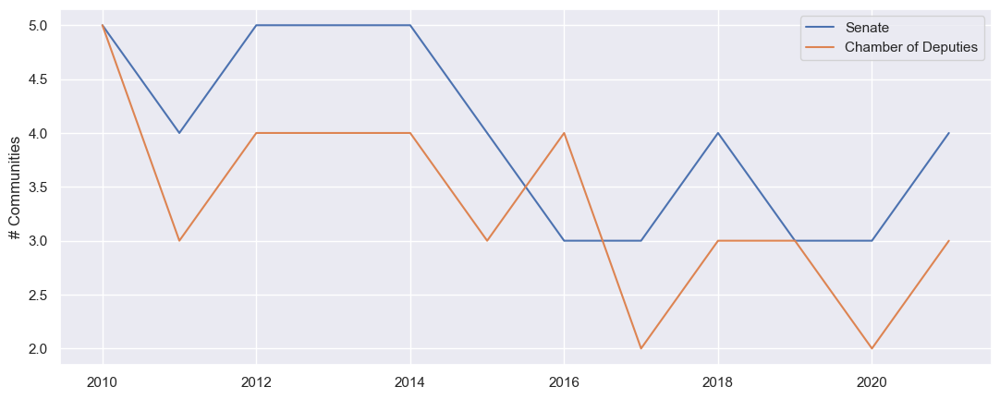

In [34]:
chamber_comm_count = [len(communities_chamber[year]['backbone']['partition']) for year in communities_chamber]
senate_comm_count = [len(communities_senate[year]['backbone']['partition']) for year in communities_senate]

plt.figure(figsize=(13,5))
sns.lineplot(x=[year for year in graphs_senate], y=senate_comm_count, label='Senate')
sns.lineplot(x=[year for year in graphs_senate], y=chamber_comm_count, label='Chamber of Deputies')
plt.ylabel('# Communities')
plt.legend()

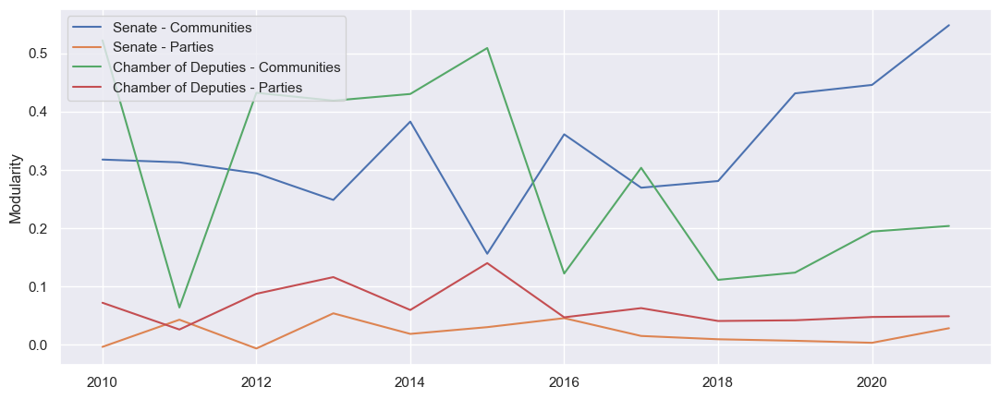

In [35]:
plt.figure(figsize=(13,5))
sns.lineplot(x=[year for year in graphs_senate], y=comm_modularity_senate, label='Senate - Communities')
sns.lineplot(x=[year for year in graphs_senate], y=senate_modularities_parties, label='Senate - Parties')
sns.lineplot(x=[year for year in graphs_senate], y=comm_modularity_chamber, label='Chamber of Deputies - Communities')
sns.lineplot(x=[year for year in graphs_senate], y=chamber_modularities_parties, label='Chamber of Deputies - Parties')
plt.ylabel('Modularity')
plt.legend()

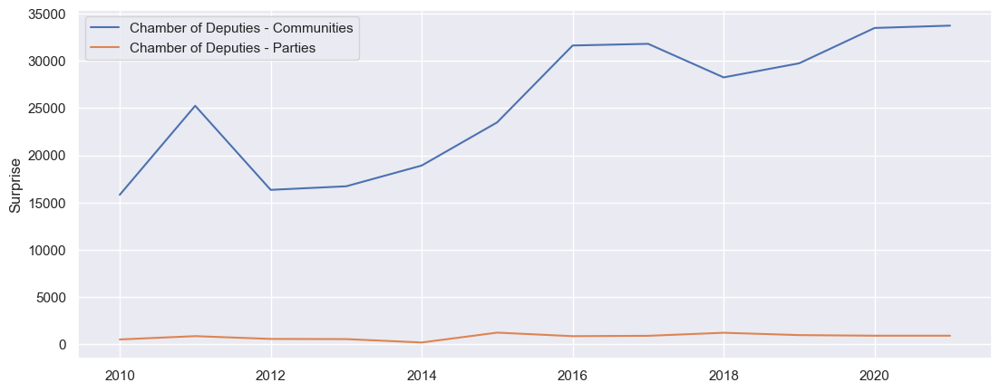

In [36]:
plt.figure(figsize=(13,5))
sns.lineplot(x=[year for year in graphs_senate], y=comm_surprise_chamber, label='Chamber of Deputies - Communities')
sns.lineplot(x=[year for year in graphs_senate], y=chamber_surprise_parties, label='Chamber of Deputies - Parties')
plt.ylabel('Surprise')
plt.legend()

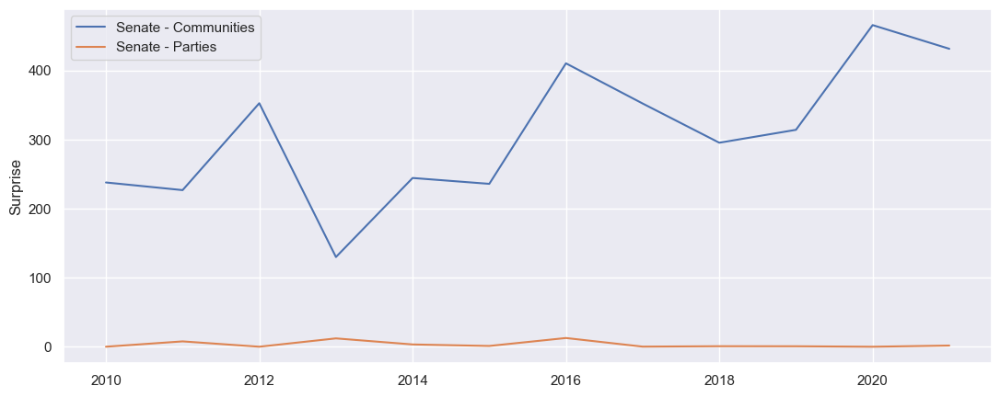

In [37]:
plt.figure(figsize=(13,5))
sns.lineplot(x=[year for year in graphs_senate], y=comm_surprise_senate, label='Senate - Communities')
sns.lineplot(x=[year for year in graphs_senate], y=senate_surprise_parties, label='Senate - Parties')
plt.ylabel('Surprise')
plt.legend()

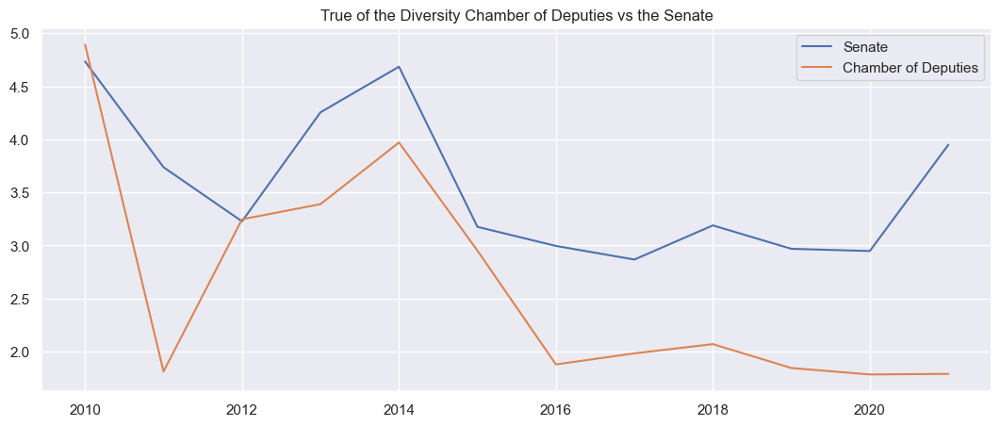

In [38]:
plt.figure(figsize=(13,5))
sns.lineplot(x=[year for year in graphs_senate], y=[senate_communities_true_diversity
                                                    [i]['backbone'] for i in senate_communities_true_diversity], label='Senate')
sns.lineplot(x=[year for year in graphs_senate], y=[chamber_communities_true_diversity[i]['backbone'] for i in chamber_communities_true_diversity], label='Chamber of Deputies')
plt.title('True of the Diversity Chamber of Deputies vs the Senate')
plt.legend()

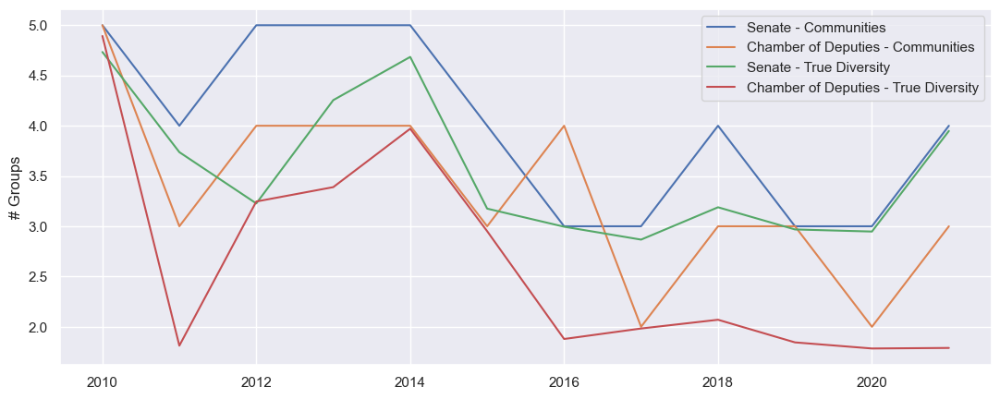

In [39]:
plt.figure(figsize=(13,5)) 
sns.lineplot(x=[year for year in graphs_senate], y=senate_comm_count, label='Senate - Communities')
sns.lineplot(x=[year for year in graphs_senate], y=chamber_comm_count, label='Chamber of Deputies - Communities')
sns.lineplot(x=[year for year in graphs_senate], y=[senate_communities_true_diversity
                                                    [i]['backbone'] for i in senate_communities_true_diversity], label='Senate - True Diversity')
sns.lineplot(x=[year for year in graphs_senate], y=[chamber_communities_true_diversity[i]['backbone'] for i in chamber_communities_true_diversity], label='Chamber of Deputies - True Diversity')
# plt.title('True of the Diversity Chamber of Deputies vs the Senate')
plt.ylabel('# Groups')
plt.legend()

In [40]:
g_comms = []
m_comms = []
for year in tqdm([i for i in range(2010, 2022)]):
    graphs_senate[year], g_dict = add_communities(graphs_senate[year], communities_senate[year]['original']['partition'])
    backboned_senate[year], m_dict = add_communities(backboned_senate[year], communities_senate[year]['backbone']['partition'])
    
    g_comms.append(g_dict)
    m_comms.append(m_dict)

100%|████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 4785.74it/s]


In [41]:
g_comms = []
m_comms = []
for year in tqdm([i for i in range(2010, 2022)]):
    graphs_chamber[year], g_dict = add_communities(graphs_chamber[year], communities_chamber[year]['original']['partition'])
    backboned_chamber[year], m_dict = add_communities(backboned_chamber[year], communities_chamber[year]['backbone']['partition'])
    
    g_comms.append(g_dict)
    m_comms.append(m_dict)

100%|████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 1028.54it/s]


In [42]:
palette = {'left': '#DBE9F6', 'center-left': '#BAD6EB', 'center': '#89BEDC', 'center-right': '#539ECD', 'right': '#2B7BBA', 'NA': 'white'}

alinhamento.loc[alinhamento['alinhamento'] == 'left', 'color'] = 1
alinhamento.loc[alinhamento['alinhamento'] == 'center-left', 'color'] = 2
alinhamento.loc[alinhamento['alinhamento'] == 'center', 'color'] = 3
alinhamento.loc[alinhamento['alinhamento'] == 'center-right', 'color'] = 4
alinhamento.loc[alinhamento['alinhamento'] == 'right', 'color'] = 5
alinhamento.loc[alinhamento['alinhamento'] == 'NA', 'color'] = 3

In [43]:
party_mapper = {'AVANTE': 3.0,
'CIDADANIA': 2.0,
'DC': 4.0,
'DEM': 4.0,
'MDB': 3.0,
'NOVO': 5.0,
'PATRI': 5.0,
'PCdoB': 1.0,
'PDT': 2.0,
'PHS': 4.0,
'PODEMOS': 4.0,
'PL': 5.0,
'PMB': 4.0,
'PMN': 2.0,
'PP': 4.0,
'PPL': 1.0,
'REPUBLICANOS': 5.0,
'PROS': 3.0,
'PRP': 5.0,
'PRTB': 5.0,
'PSB': 1.0,
'PSC': 5.0,
'PSD': 3.0,
'PSDB': 3.0,
'PSL': 5.0,
'PSOL': 1.0,
'PT': 1.0,
'PTB': 5.0,
'PTC': 3.0,
'PV': 2.0,
'REDE': 1.0,
'S.PART.': 3.0,
'SOLIDARIEDADE': 2.0}

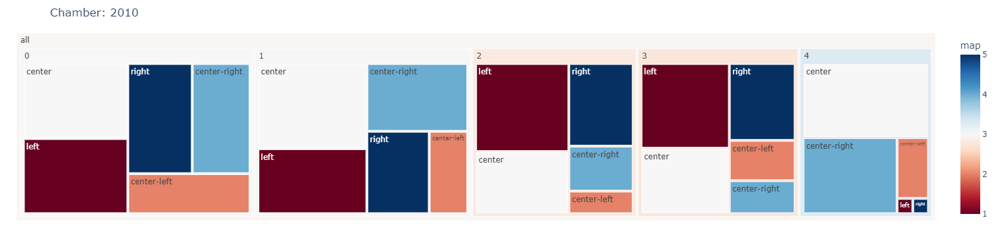

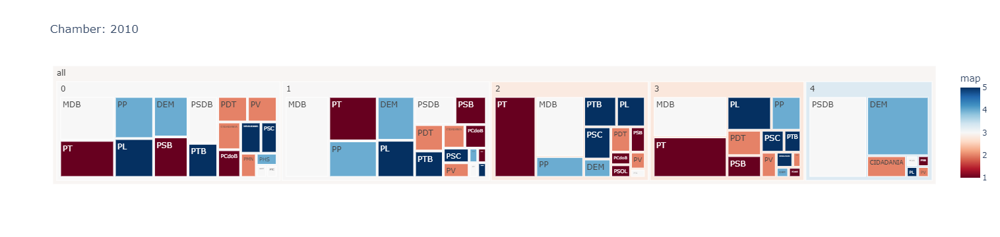

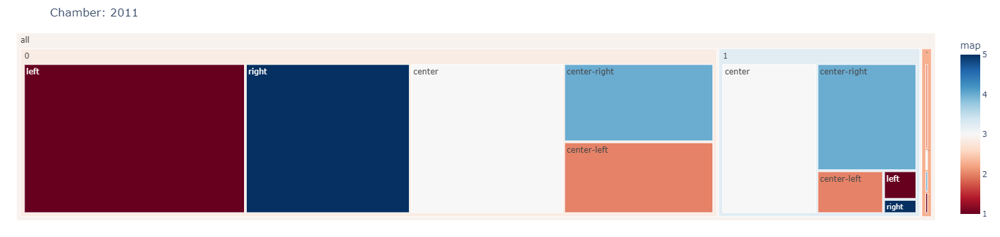

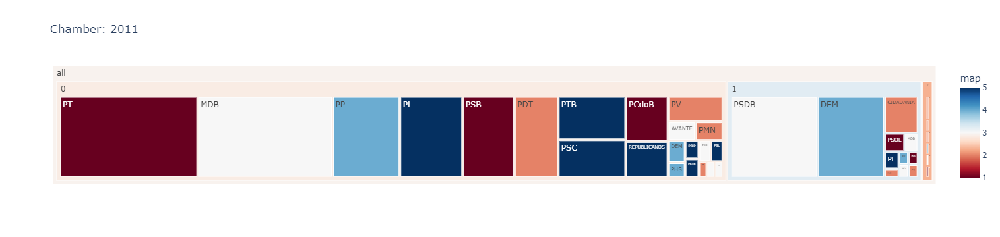

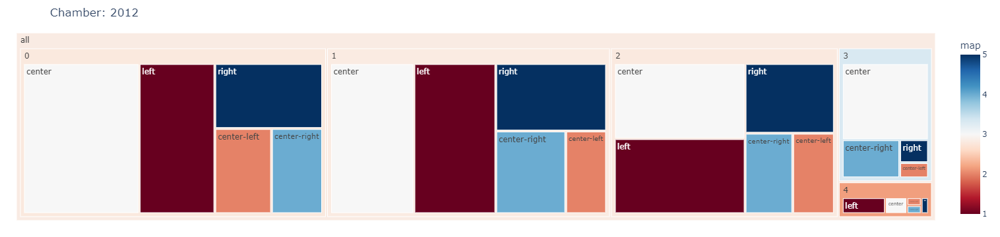

...

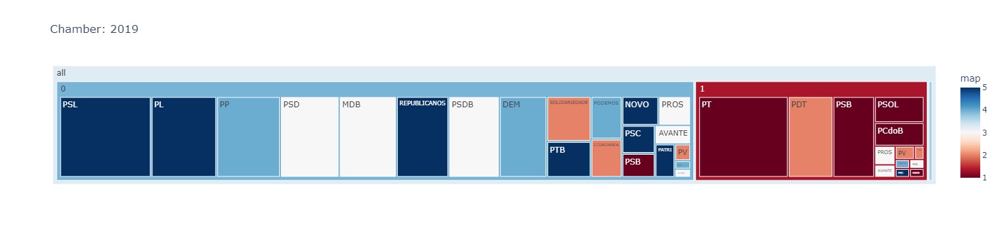

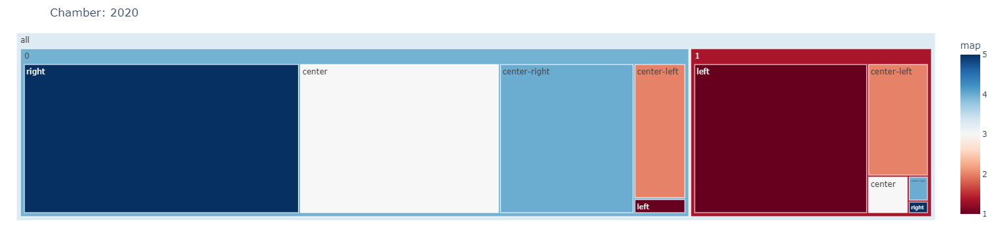

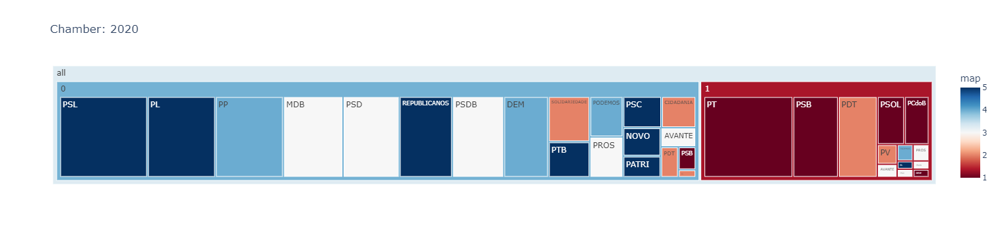

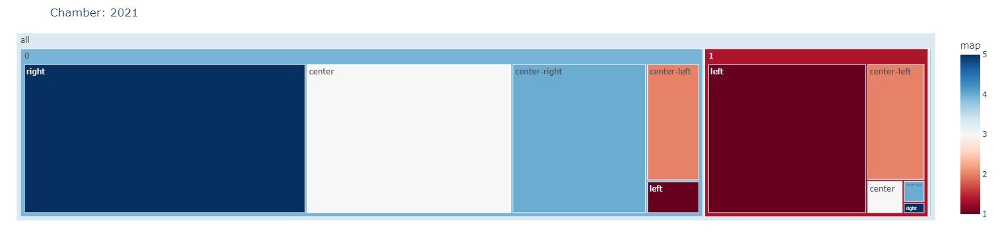

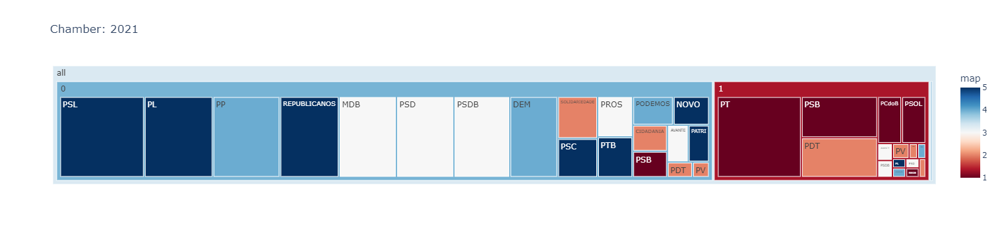

In [160]:
for year in [i for i in range(2010, 2022)]:
    comunidades = pd.DataFrame.from_dict((dict(backboned_chamber[year].nodes(data=True))), orient='index')
    comunidades = comunidades.merge(alinhamento, left_on='partido', right_on='community_1', how='left')
    counting = comunidades.groupby(['community', 'alinhamento'], as_index=False)[['nome']].count()
    
    mapper = {'left': 1, 'center-left': 2, 'center': 3, 'center-right': 4, 'right': 5, 'NA': 3}
    counting['map'] = counting['alinhamento'].map(mapper)
    
    fig = px.treemap(counting, path=[px.Constant("all"), 'community', 'alinhamento'], 
                 values='nome', color='map', title=f'Chamber: {year}', color_continuous_scale='RdBu')
    fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
    fig.show()

#     plt.figure(figsize=(15,9))
#     sns.barplot(data=counting, x='community', y='nome', hue='alinhamento', width=0.8, palette=palette)
#     plt.legend(loc='upper right')
#     plt.title(f'Chamber: {year}')
#     plt.show()
    
    comunidades = pd.DataFrame.from_dict((dict(backboned_chamber[year].nodes(data=True))), orient='index')
    counting = comunidades.groupby(['community', 'partido'], as_index=False)[['nome']].count()
    counting['map'] = counting['partido'].map(party_mapper)
    
    # plt.figure(figsize=(15,9))
    # sns.barplot(data=counting, x='community', y='nome', hue='partido', width=1, palette='Blues')
    # plt.legend(loc='upper right')
    # plt.title(f'Chamber: {year}')
    # plt.show()
    
    fig = px.treemap(counting, path=[px.Constant("all"), 'community', 'partido'], 
                 values='nome', color='map', title=f'Chamber: {year}', color_continuous_scale='RdBu')
    #fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
    fig.update_traces(marker=dict(cornerradius=5))
    fig.show()

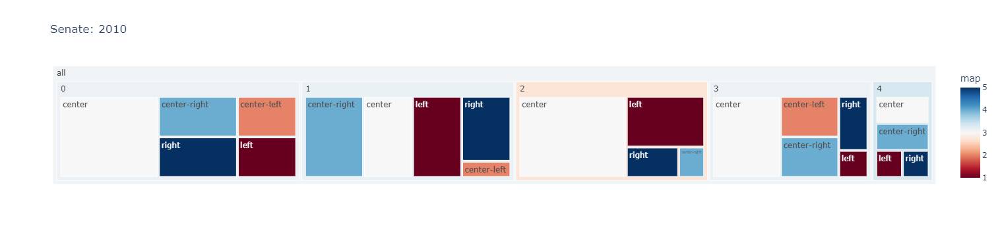

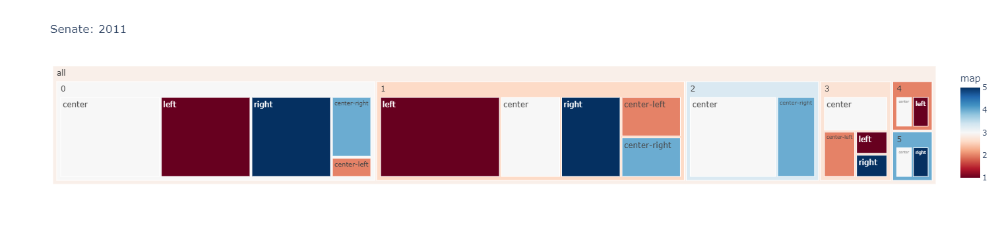

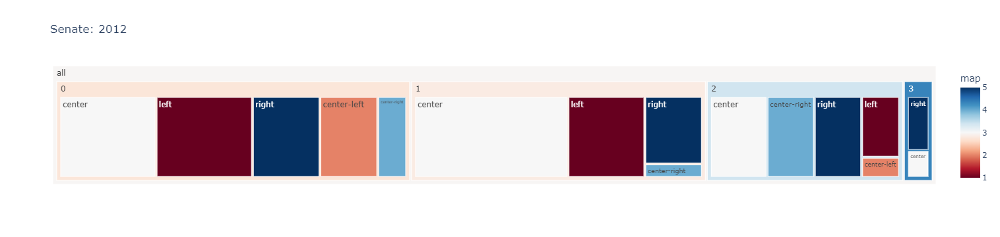

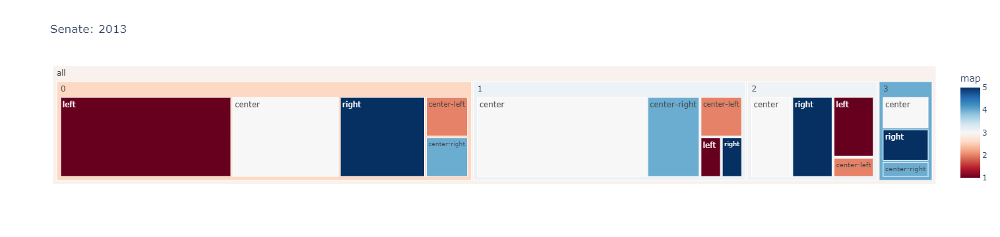

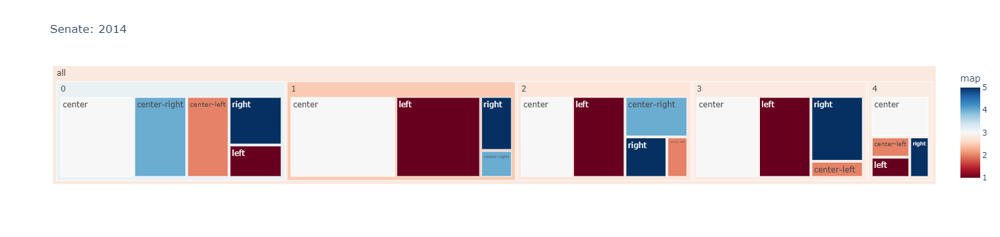

...

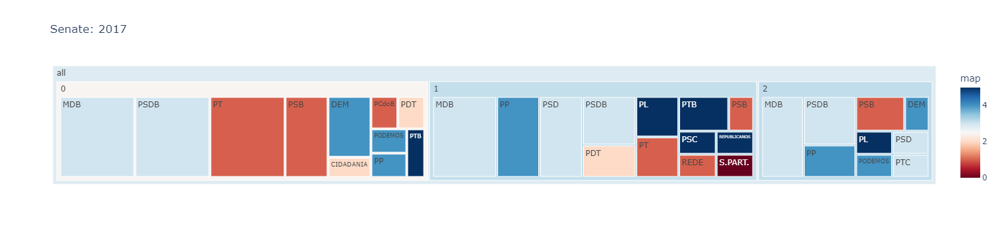

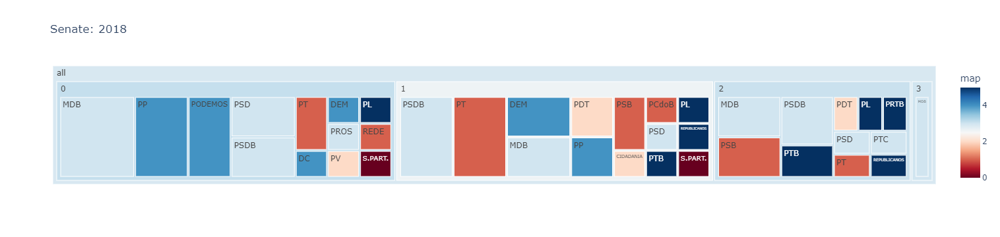

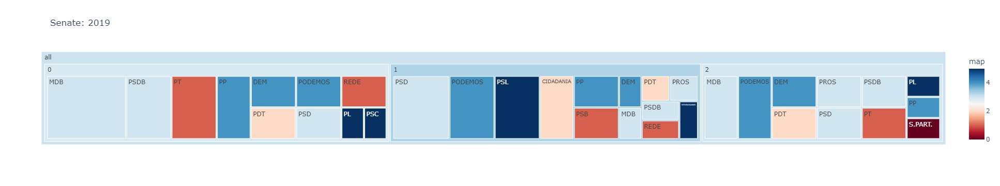

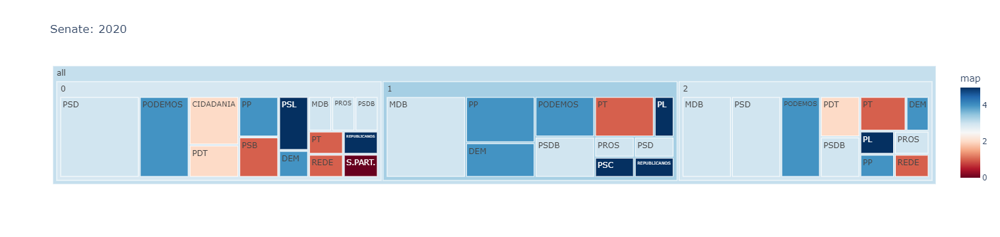

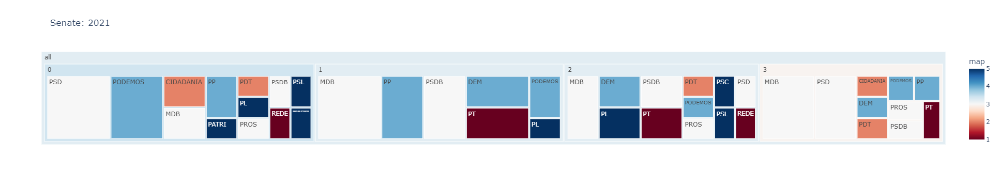

In [127]:
for year in [i for i in range(2010, 2022)]:
    comunidades = pd.DataFrame.from_dict((dict(backboned_senate[year].nodes(data=True))), orient='index')
    comunidades = comunidades.merge(alinhamento, left_on='partido', right_on='community_1', how='left')
    counting = comunidades.groupby(['community', 'alinhamento'], as_index=False)[['nome']].count()
    
    mapper = {'left': 1, 'center-left': 2, 'center': 3, 'center-right': 4, 'right': 5, 'NA': 3}
    counting['map'] = counting['alinhamento'].map(mapper)
    
    fig = px.treemap(counting, path=[px.Constant("all"), 'community', 'alinhamento'], 
                 values='nome', color='map', title=f'Senate: {year}', color_continuous_scale='RdBu')
    #fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
    fig.show()

    # plt.figure(figsize=(15,9))
    # sns.barplot(data=counting, x='community', y='nome', hue='alinhamento', width=0.8, palette=palette)
    # plt.legend(loc='upper right')
    # plt.title(f'Senate: {year}')
    # plt.show()
    
for year in [i for i in range(2010, 2022)]:
    comunidades = pd.DataFrame.from_dict((dict(backboned_senate[year].nodes(data=True))), orient='index')
    counting = comunidades.groupby(['community', 'partido'], as_index=False)[['nome']].count()
    counting['map'] = counting['partido'].map(party_mapper)

    # plt.figure(figsize=(15,9))
    # sns.barplot(data=counting, x='community', y='nome', hue='partido', width=1, palette='Blues')
    # plt.legend(loc='upper right')
    # plt.title(f'Senate: {year}')
    # plt.show()
    
    fig = px.treemap(counting, path=[px.Constant("all"), 'community', 'partido'], 
                 values='nome', color='map', title=f'Senate: {year}',  color_continuous_scale='RdBu')
    # fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
    fig.show()

In [45]:
average_shortest_paths_senate = []
for year in tqdm(graphs_senate):
    average_shortest_paths_senate.append(np.mean(np.array([list(i[1].values()) for i in nx.shortest_path_length(backboned_senate[year], weight='distance')]).flatten()))
    
average_shortest_paths_chamber = []
for year in tqdm(graphs_chamber):
    average_shortest_paths_chamber.append(np.mean(np.array([list(i[1].values()) for i in nx.shortest_path_length(backboned_chamber[year], weight='distance')]).flatten()))

100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [29:25<00:00, 147.16s/it]


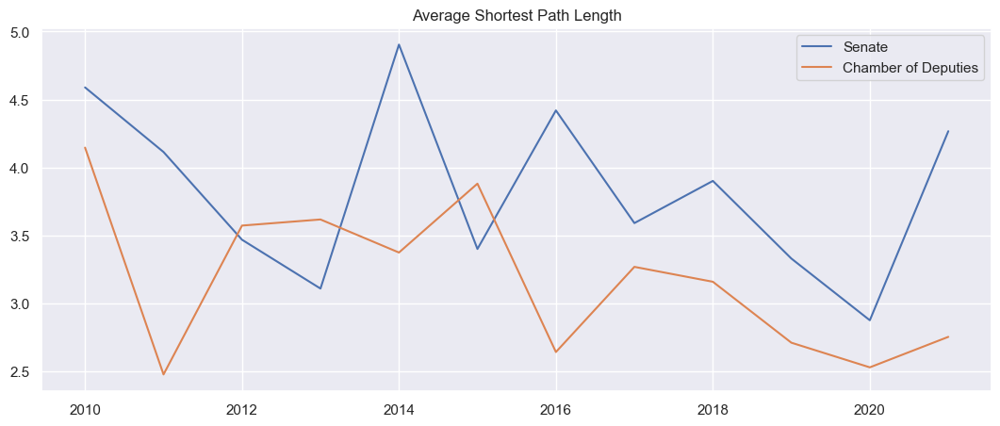

In [46]:
plt.figure(figsize=(13,5))
sns.lineplot(x=[year for year in graphs_senate], y=average_shortest_paths_senate, label='Senate')
sns.lineplot(x=[year for year in graphs_senate], y=average_shortest_paths_chamber, label='Chamber of Deputies')
plt.title('Average Shortest Path Length')
plt.legend()

In [48]:
for year in tqdm(backboned_senate):
    nx.write_gexf(backboned_senate[year], f"../../data/auxiliar/gephi_files/PLOS/PLOS_S.O.1_senate_{year}_backboned_with_communities.gexf")
    nx.write_gexf(graphs_senate[year], f"../../data/auxiliar/gephi_files/PLOS/PLOS_S.O.1_senate_{year}_with_communities.gexf")
    
for year in tqdm(backboned_chamber):
    nx.write_gexf(backboned_chamber[year], f"../../data/auxiliar/gephi_files/PLOS/PLOS_S.O.1_chamber_{year}_backboned_with_communities.gexf")
    nx.write_gexf(graphs_chamber[year], f"../../data/auxiliar/gephi_files/PLOS/PLOS_S.O.1_chamber_{year}_with_communities.gexf")

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [01:12<00:00,  6.05s/it]


In [49]:
apply_metrics(graphs_senate, backboned_senate, type_='backboned', att='partido', house='senate')
apply_metrics(graphs_chamber, backboned_chamber, type_='backboned', att='partido', house='chamber')

apply_metrics(graphs_senate, backboned_senate, type_='backboned', att='community', house='senate')
apply_metrics(graphs_chamber, backboned_chamber, type_='backboned', att='community', house='chamber')

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [07:09<00:00, 35.79s/it]


In [50]:
chamber_metrics_individual = pd.DataFrame()
senate_metrics_individual = pd.DataFrame()

chamber_metrics_coalition = pd.DataFrame()
senate_metrics_coalition = pd.DataFrame()

for file in tqdm(os.listdir('../../data/metrics/PLOS/individual_metrics')):
    year = file.split('_')[0]
    party = file.split('_')[1]
    second_party = file.split('_')[2]
    
    dict_ = pd.read_pickle(os.path.join('../../data/metrics/PLOS/individual_metrics', file))
    
    if second_party in ['original', 'backboned']:
        type_ = 'individual'
        if 'senate' in file:
            senate_metrics_individual = senate_metrics_individual.append(dict_, ignore_index=True)
        else:
            chamber_metrics_individual = chamber_metrics_individual.append(dict_, ignore_index=True)
    else:
        type_ = 'coalition'
        if 'senate' in file:
            senate_metrics_coalition = senate_metrics_coalition.append(dict_, ignore_index=True)
        else:
            chamber_metrics_coalition = chamber_metrics_coalition.append(dict_, ignore_index=True)

100%|█████████████████████████████████████████████████████████████████████████████| 5863/5863 [00:40<00:00, 146.50it/s]


In [ ]:
governments = {
    2010: 'PT',
    2011: 'PT',
    2012: 'PT',
    2013: 'PT',
    2014: 'PT',
    2015: 'PT',
    2016: 'PT',
    2017: 'MDB',
    2018: 'MDB',
    2019: 'PSL',
    2020: 'PL',
    2021: 'PL'
}

In [185]:
perc = 0.25
for year in governments:
    government_party = governments[year]

    aux = chamber_metrics_coalition[
        (chamber_metrics_coalition['year'] == year)&(chamber_metrics_coalition['type'] == 'backboned')&((chamber_metrics_coalition['community_1'] == government_party)|(chamber_metrics_coalition['community_2'] == government_party))
    ].sort_values('coalition')

    # government = set(aux.head(5)['community_1'].unique()).union(set(aux.head(5)['community_2'].unique()))
    # opposition = set(aux.tail(5)['community_1'].unique()).union(set(aux.tail(5)['community_2'].unique())) - set([government_party])
    
    government = set(aux[aux['coalition'] < aux['coalition'].quantile(perc)]['community_1'].unique()).union(set((aux[aux['coalition'] < aux['coalition'].quantile(perc)]['community_2'].unique())))
    opposition = set(aux[aux['coalition'] > aux['coalition'].quantile(1 - perc)]['community_1'].unique()).union(set((aux[aux['coalition'] > aux['coalition'].quantile(1 - perc)]['community_2'].unique()))) - set([government_party])
    
    print(f'For {year}, opposition = {opposition}, government = {government}')

For 2010, opposition = {'PMN', 'PSB', 'AVANTE', 'PTB', 'PTC'}, government = {'PSC', 'PT', 'PCdoB', 'MDB', 'PSOL', 'PDT'}
For 2011, opposition = {'DEM', 'PV', 'PSD', 'PSOL', 'PSDB', 'CIDADANIA'}, government = {'PRTB', 'PT', 'PCdoB', 'PMN', 'PHS', 'PTC', 'REPUBLICANOS'}
For 2012, opposition = {'DEM', 'PRTB', 'PRP', 'PSDB', 'PTB', 'CIDADANIA'}, government = {'AVANTE', 'PSL', 'PT', 'PV', 'PMN', 'PHS', 'REPUBLICANOS'}
For 2013, opposition = {'DEM', 'PSOL', 'PSDB', 'PATRI', 'PTB', 'CIDADANIA'}, government = {'PV', 'S.PART.', 'AVANTE', 'PT', 'PCdoB', 'PHS', 'REPUBLICANOS'}
For 2014, opposition = {'DEM', 'PSB', 'SOLIDARIEDADE', 'PATRI', 'CIDADANIA', 'DC'}, government = {'AVANTE', 'PROS', 'PT', 'PCdoB', 'PL', 'PMN', 'REPUBLICANOS'}
For 2015, opposition = {'DEM', 'PSB', 'PSOL', 'S.PART.', 'PSDB', 'SOLIDARIEDADE', 'CIDADANIA'}, government = {'PSL', 'PDT', 'PROS', 'PT', 'PCdoB', 'PL', 'DC', 'REPUBLICANOS'}
For 2016, opposition = {'DEM', 'PSC', 'PSL', 'PRTB', 'PRP', 'PSDB', 'SOLIDARIEDADE'}, govern

For 2010, opposition = {'AVANTE', 'PTB', 'PMN'}, government = {'PT', 'PSC', 'PSOL', 'MDB'}


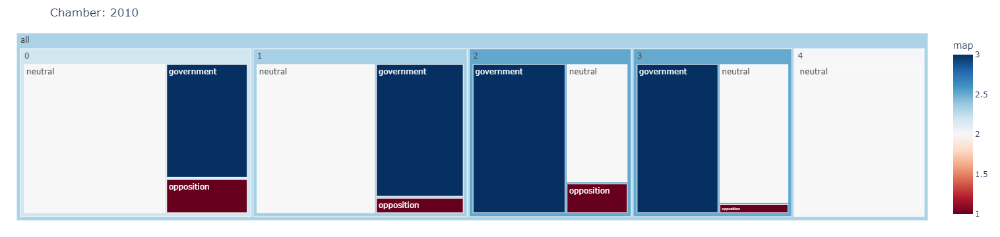

For 2011, opposition = {'PSDB', 'DEM', 'CIDADANIA', 'PSOL'}, government = {'PT', 'PCdoB', 'PMN', 'PHS', 'PTC'}


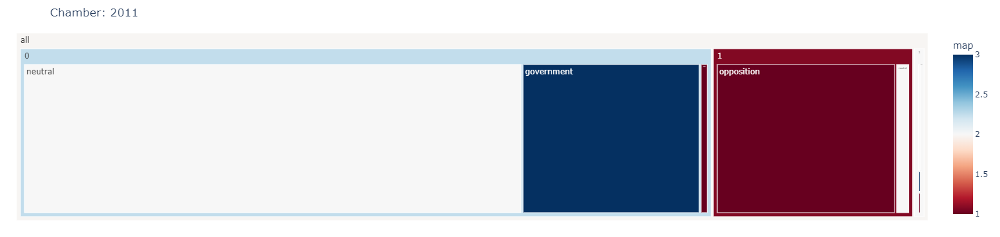

For 2012, opposition = {'DEM', 'PRP', 'PRTB', 'CIDADANIA'}, government = {'PSL', 'PT', 'PV', 'PHS', 'REPUBLICANOS'}


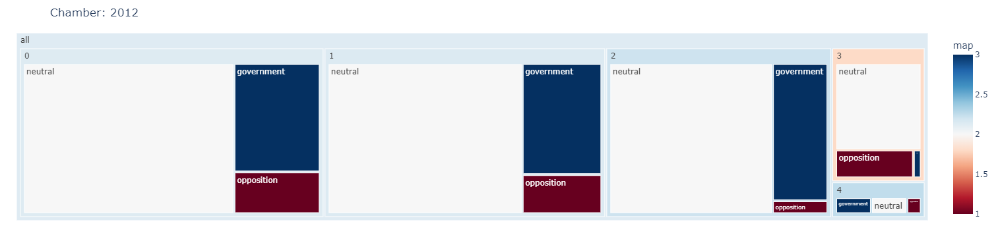

For 2013, opposition = {'PATRI', 'PSDB', 'CIDADANIA', 'PSOL'}, government = {'AVANTE', 'PT', 'PCdoB', 'PHS', 'S.PART.'}


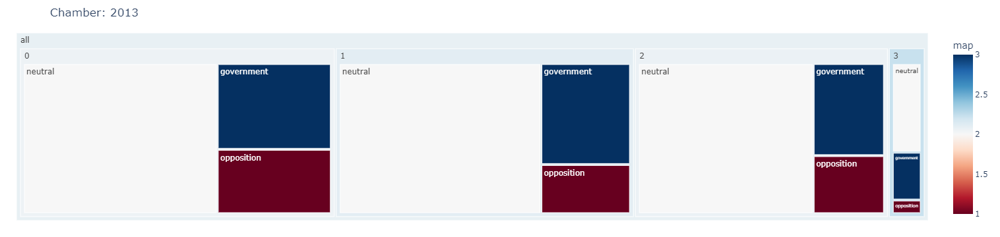

For 2014, opposition = {'PATRI', 'DEM', 'CIDADANIA', 'DC'}, government = {'AVANTE', 'PROS', 'PT', 'PCdoB', 'PMN'}


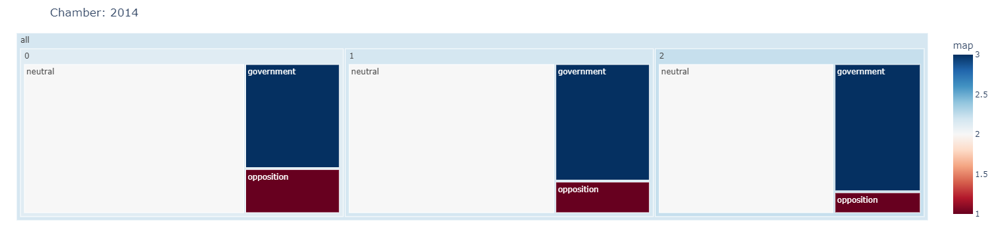

For 2015, opposition = {'DEM', 'PSOL', 'PSDB', 'SOLIDARIEDADE', 'CIDADANIA'}, government = {'PSL', 'PROS', 'PT', 'PCdoB', 'DC', 'PDT'}


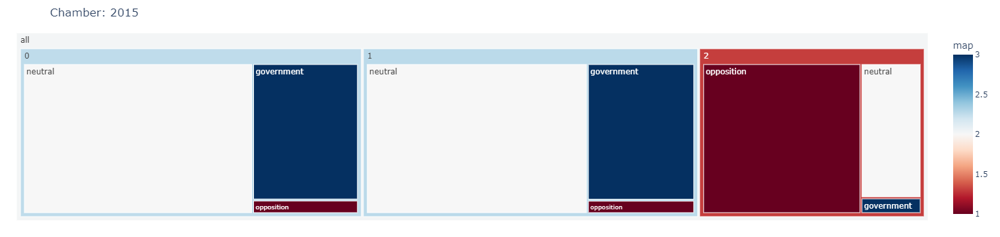

For 2016, opposition = {'SOLIDARIEDADE', 'PSC', 'PRTB', 'PSL'}, government = {'PT', 'PCdoB', 'REDE', 'PSOL', 'PDT'}


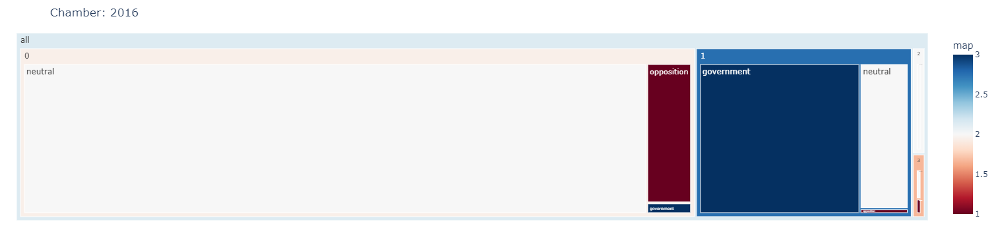

For 2017, opposition = {'PSOL', 'REDE', 'PT', 'PCdoB'}, government = {'PSDB', 'PP', 'MDB', 'PATRI', 'PSD'}


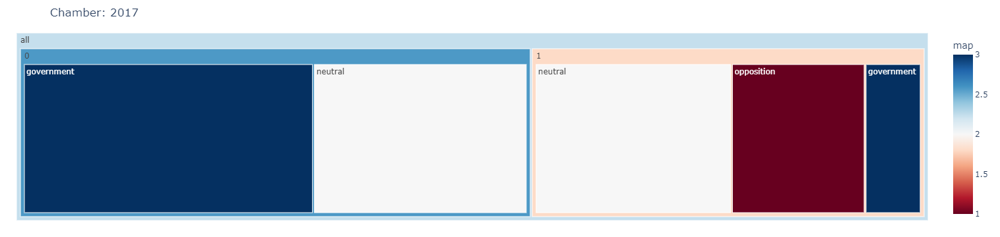

For 2018, opposition = {'PSOL', 'REDE', 'PT', 'PCdoB'}, government = {'DEM', 'PSL', 'MDB', 'PPL', 'REPUBLICANOS'}


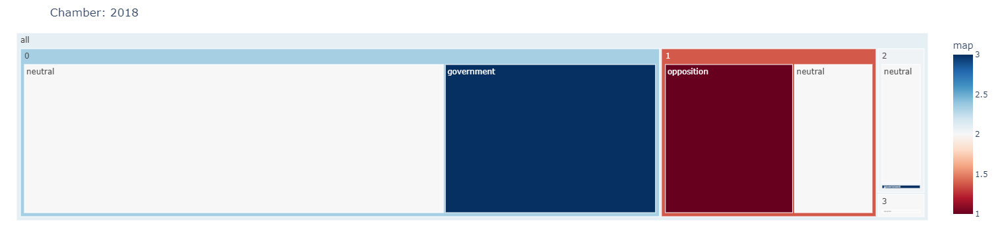

For 2019, opposition = {'PSOL', 'REDE', 'PT', 'PCdoB'}, government = {'PSL', 'PATRI', 'PTB', 'NOVO', 'S.PART.'}


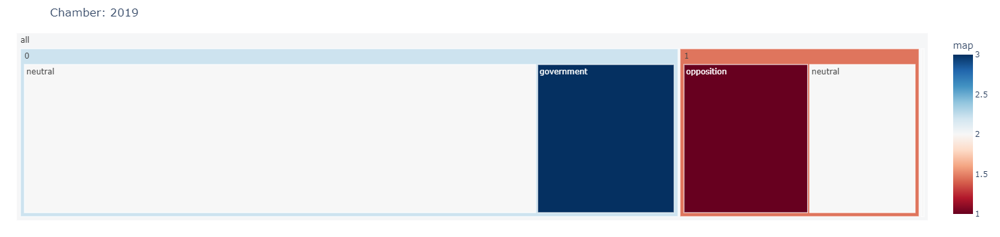

For 2020, opposition = {'PSOL', 'REDE', 'PT', 'PCdoB'}, government = {'PSL', 'PL', 'PATRI', 'PTB', 'REPUBLICANOS'}


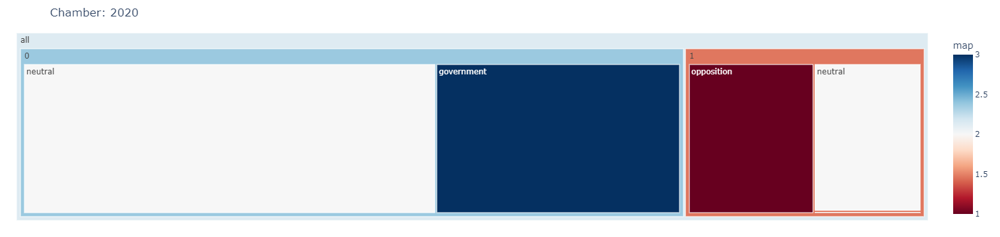

For 2021, opposition = {'PSOL', 'REDE', 'PT', 'PCdoB'}, government = {'PSC', 'PSL', 'PL', 'PATRI', 'REPUBLICANOS'}


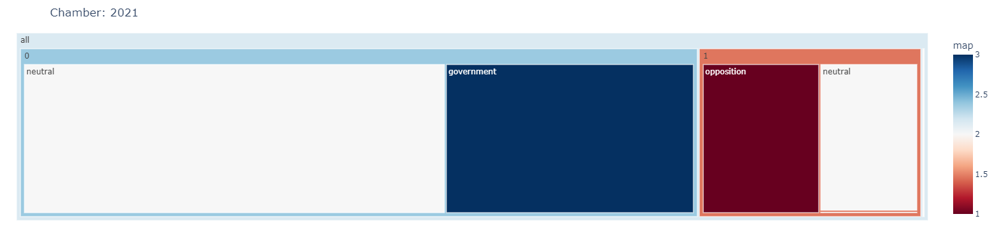

In [187]:
perc = 0.15
for year in governments:
    government_party = governments[year]

    aux = chamber_metrics_coalition[
        (chamber_metrics_coalition['year'] == year)&(chamber_metrics_coalition['type'] == 'backboned')&((chamber_metrics_coalition['community_1'] == government_party)|(chamber_metrics_coalition['community_2'] == government_party))
    ].sort_values('coalition')

    # government = set(aux.head(5)['community_1'].unique()).union(set(aux.head(5)['community_2'].unique()))
    # opposition = set(aux.tail(5)['community_1'].unique()).union(set(aux.tail(5)['community_2'].unique())) - set([government_party])
    
    government = set(aux[aux['coalition'] < aux['coalition'].quantile(perc)]['community_1'].unique()).union(set((aux[aux['coalition'] < aux['coalition'].quantile(perc)]['community_2'].unique())))
    opposition = set(aux[aux['coalition'] > aux['coalition'].quantile(1 - perc)]['community_1'].unique()).union(set((aux[aux['coalition'] > aux['coalition'].quantile(1 - perc)]['community_2'].unique()))) - set([government_party])
    
    print(f'For {year}, opposition = {opposition}, government = {government}')
    
    comunidades = pd.DataFrame.from_dict((dict(backboned_chamber[year].nodes(data=True))), orient='index')
    counting = comunidades.groupby(['community', 'partido'], as_index=False)[['nome']].count()
    
    counting['side'] = 'neutral'
    counting['map'] = 2
    counting.loc[counting['partido'].isin(opposition), 'side'] = 'opposition'
    counting.loc[counting['partido'].isin(opposition), 'map'] = 1
    counting.loc[counting['partido'].isin(government), 'side'] = 'government'
    counting.loc[counting['partido'].isin(government), 'map'] = 3

    # plt.figure(figsize=(15,9))
    # sns.barplot(data=counting, x='community', y='nome', hue='side', width=1, palette='Blues')
    # plt.legend(loc='upper right')
    # plt.title(f'Chamber: {year}')
    # plt.show()
    
    fig = px.treemap(counting, path=[px.Constant('all'), 'community', 'side'], 
                 values='nome', color='map', title=f'Chamber: {year}', color_continuous_scale='RdBu')
    fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
    fig.show()

For 2010, opposition = {'PV', 'PDT'}, government = {'PSC', 'PT', 'PCdoB'}


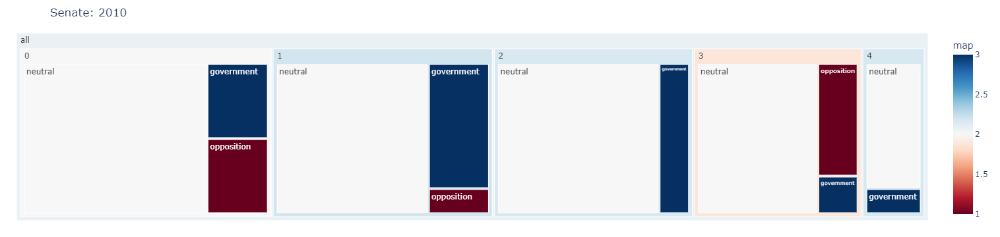

For 2011, opposition = {'DEM', 'PCdoB'}, government = {'PSC', 'PT', 'REPUBLICANOS'}


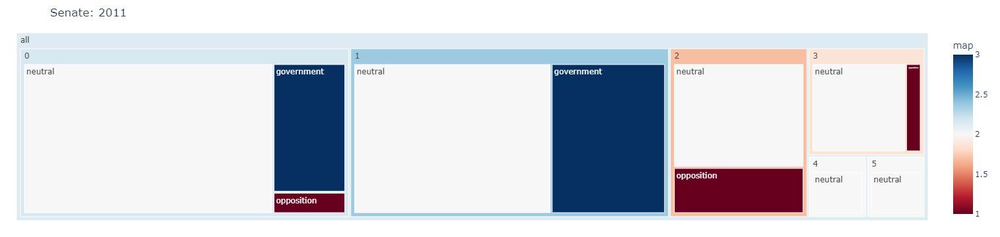

For 2012, opposition = {'PSC', 'PL', 'DEM'}, government = {'PT', 'PV', 'PSD', 'PSB'}


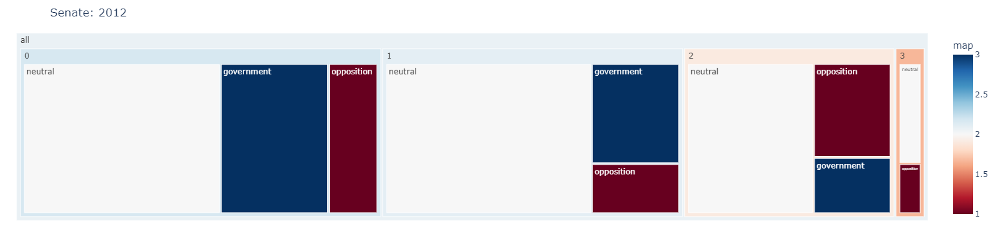

For 2013, opposition = {'PSDB', 'DEM', 'PSD'}, government = {'PT', 'PSB', 'PCdoB'}


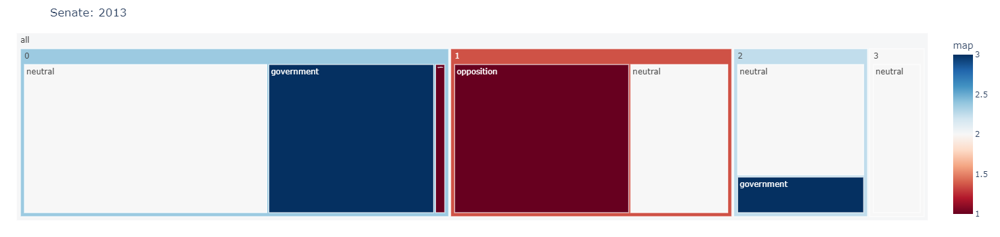

For 2014, opposition = {'DEM', 'PSD', 'PDT'}, government = {'PSC', 'SOLIDARIEDADE', 'PT', 'PSB'}


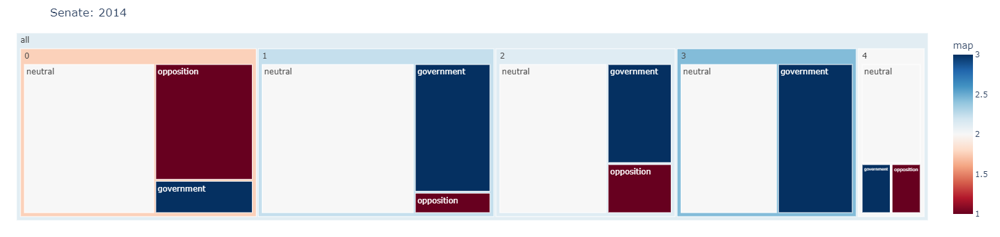

For 2015, opposition = {'DEM', 'PL', 'REPUBLICANOS'}, government = {'PT', 'S.PART.', 'PSD', 'PSOL'}


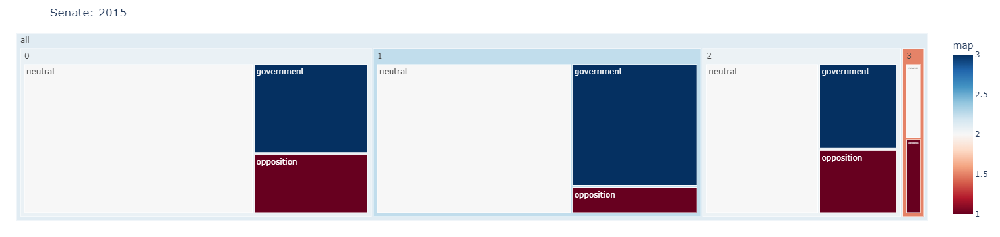

For 2016, opposition = {'DEM', 'CIDADANIA', 'PTC'}, government = {'PT', 'PCdoB', 'REDE', 'S.PART.'}


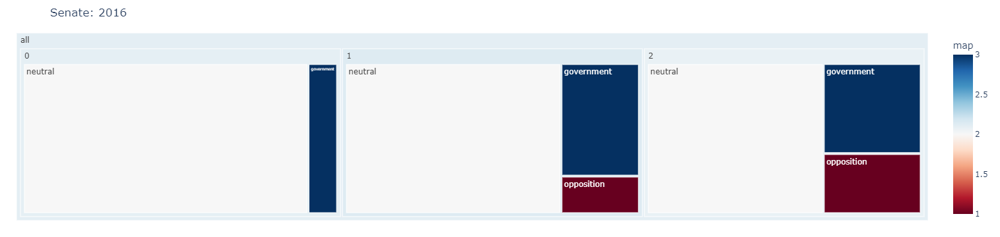

For 2017, opposition = {'DEM', 'PSD', 'PTC'}, government = {'PSC', 'MDB', 'REPUBLICANOS', 'PDT'}


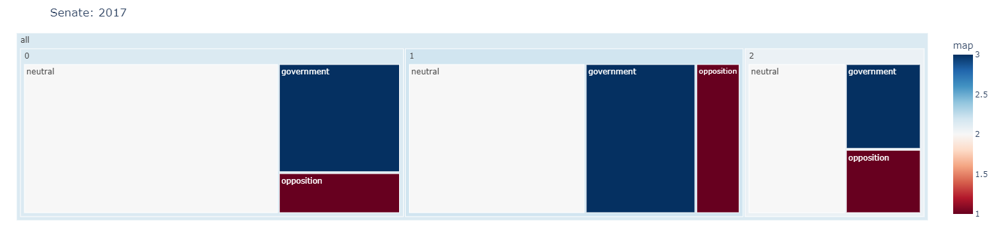

For 2018, opposition = {'PRTB', 'PSB', 'PTC'}, government = {'REDE', 'PROS', 'PODEMOS', 'MDB'}


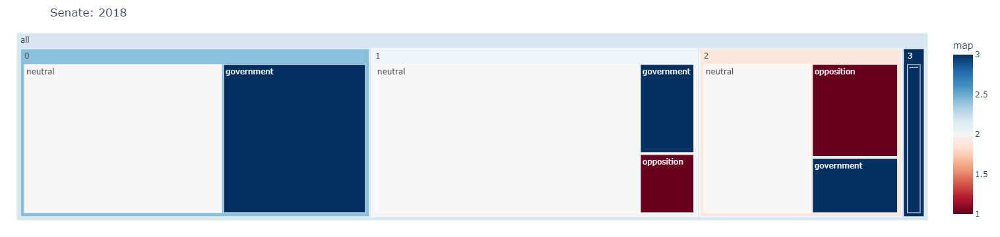

For 2019, opposition = {'PT', 'PSC', 'PL'}, government = {'PODEMOS', 'CIDADANIA', 'PSB', 'PSL'}


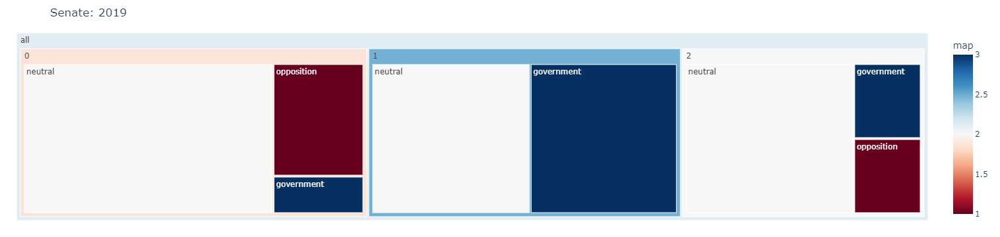

For 2020, opposition = {'PSL', 'PSB', 'REPUBLICANOS'}, government = {'DEM', 'PSC', 'PL'}


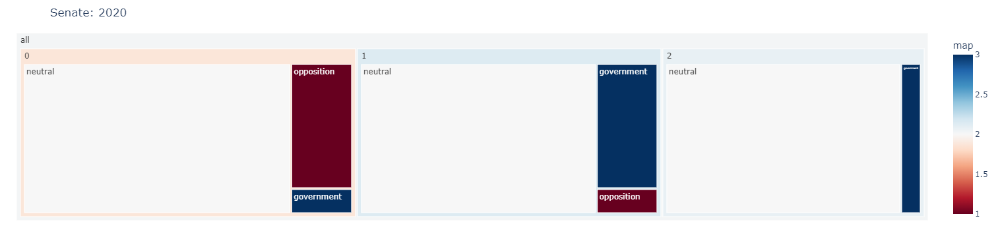

For 2021, opposition = {'PSL', 'CIDADANIA', 'REPUBLICANOS'}, government = {'PSC', 'PROS', 'PL', 'REDE'}


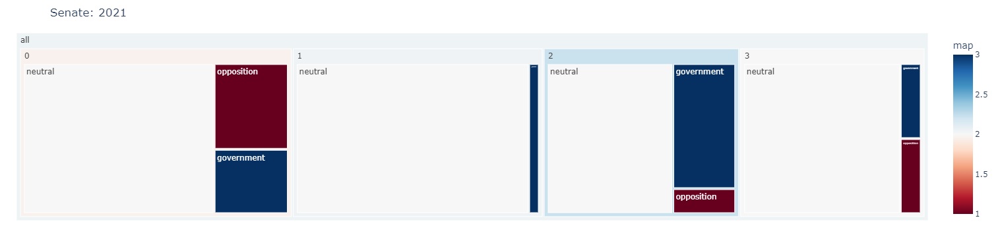

In [188]:
for year in governments:
    government_party = governments[year]

    aux = senate_metrics_coalition[
        (senate_metrics_coalition['year'] == year)&(senate_metrics_coalition['type'] == 'backboned')&((senate_metrics_coalition['community_1'] == government_party)|(senate_metrics_coalition['community_2'] == government_party))
    ].sort_values('coalition')

    government = set(aux[aux['coalition'] < aux['coalition'].quantile(perc)]['community_1'].unique()).union(set((aux[aux['coalition'] < aux['coalition'].quantile(perc)]['community_2'].unique())))
    opposition = set(aux[aux['coalition'] > aux['coalition'].quantile(1 - perc)]['community_1'].unique()).union(set((aux[aux['coalition'] > aux['coalition'].quantile(1 - perc)]['community_2'].unique()))) - set([government_party])
    
    print(f'For {year}, opposition = {opposition}, government = {government}')
    
    comunidades = pd.DataFrame.from_dict((dict(backboned_senate[year].nodes(data=True))), orient='index')
    counting = comunidades.groupby(['community', 'partido'], as_index=False)[['nome']].count()
    
    counting['side'] = 'neutral'
    counting['map'] = 2
    counting.loc[counting['partido'].isin(opposition), 'side'] = 'opposition'
    counting.loc[counting['partido'].isin(opposition), 'map'] = 1
    counting.loc[counting['partido'].isin(government), 'side'] = 'government'
    counting.loc[counting['partido'].isin(government), 'map'] = 3

#     plt.figure(figsize=(15,9))
#     sns.barplot(data=counting, x='community', y='nome', hue='side', width=1, palette='Blues')
#     plt.legend(loc='upper right')
#     plt.title(f'Senate: {year}')
#     plt.show()
    
    fig = px.treemap(counting, path=[px.Constant('all'), 'community', 'side'], 
                 values='nome', color='map', title=f'Senate: {year}', color_continuous_scale='RdBu')
    fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
    fig.show()

In [51]:
chamber_metrics_individual['community_1'] = chamber_metrics_individual['community_1'].astype(str)
senate_metrics_individual['community_1'] = senate_metrics_individual['community_1'].astype(str)

In [52]:
chamber_metrics_individual.to_parquet('../../data/metrics/PLOS/PLOS_chamber_metrics_individual.parquet')
senate_metrics_individual.to_parquet('../../data/metrics/PLOS/PLOS_senate_metrics_individual.parquet')

In [53]:
chamber_ranking = pd.DataFrame()

for year in chamber_metrics_individual['year'].unique():
    for att in ['partido', 'community']:
        aux = chamber_metrics_individual[(chamber_metrics_individual['year'] == year)&(chamber_metrics_individual['att'] == att)]
        aux['rank_fragmentation'] = aux['fragmentation'].rank(ascending=True)
        aux['rank_isolation'] = aux['isolation'].rank(ascending=True)
        chamber_ranking = pd.concat([chamber_ranking, aux])
    
senate_ranking = pd.DataFrame()

for year in senate_metrics_individual['year'].unique():
    for att in ['partido', 'community']:
        aux = senate_metrics_individual[(senate_metrics_individual['year'] == year)&(senate_metrics_individual['att'] == att)]
        aux['rank_fragmentation'] = aux['fragmentation'].rank(ascending=True)
        aux['rank_isolation'] = aux['isolation'].rank(ascending=True)
        senate_ranking = pd.concat([senate_ranking, aux])

In [54]:
chamber_ranking = chamber_ranking.merge(alinhamento, on='community_1', how='left')
senate_ranking = senate_ranking.merge(alinhamento, on='community_1', how='left')

chamber_ranking = chamber_ranking[chamber_ranking['type'] == 'backboned']
senate_ranking = senate_ranking[senate_ranking['type'] == 'backboned']

Text(0.5, 1.0, 'Rank Fragmentation for the Chamber of Deputies')

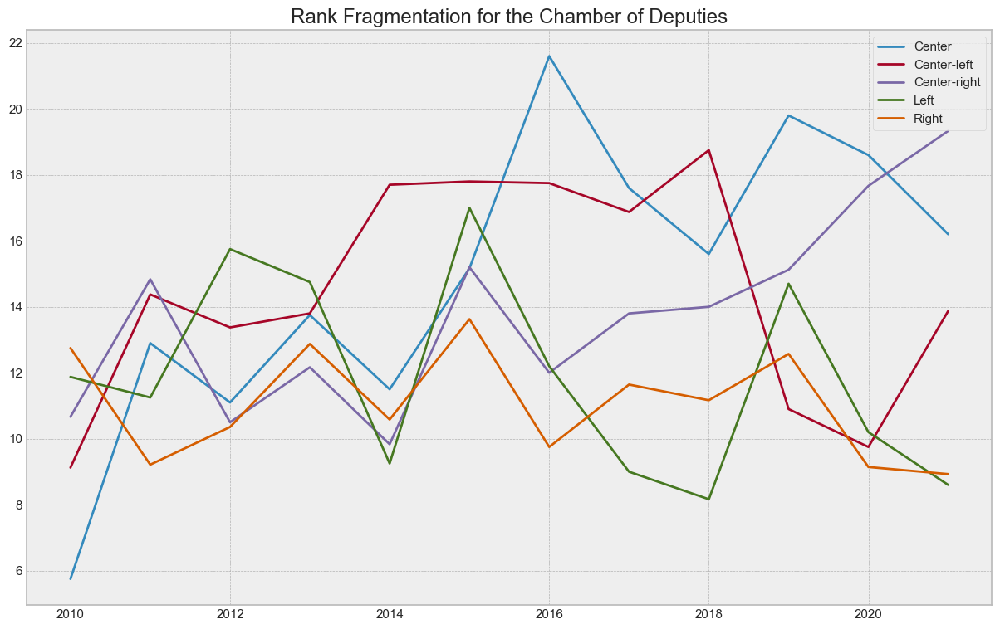

In [55]:
plt.figure(figsize=(15,9))
als = []
for alinhamento_ in chamber_ranking['alinhamento'].unique():
    if alinhamento_ == 'NA' or alinhamento_ is np.nan:
        continue
    aux = chamber_ranking.groupby(['alinhamento', 'year'], as_index=False).agg({'rank_fragmentation': ['mean', 'median', 'std'], 'rank_isolation': ['mean', 'median', 'std']})
    aux = aux[aux['alinhamento'] == alinhamento_]
    
    plt.plot(aux['year'], aux[('rank_fragmentation', 'mean')])
    als.append(alinhamento_)

als = [x.capitalize() for x in als]
plt.legend(als)
plt.title('Rank Fragmentation for the Chamber of Deputies')

Text(0.5, 1.0, 'Rank Fragmentation for the Senate')

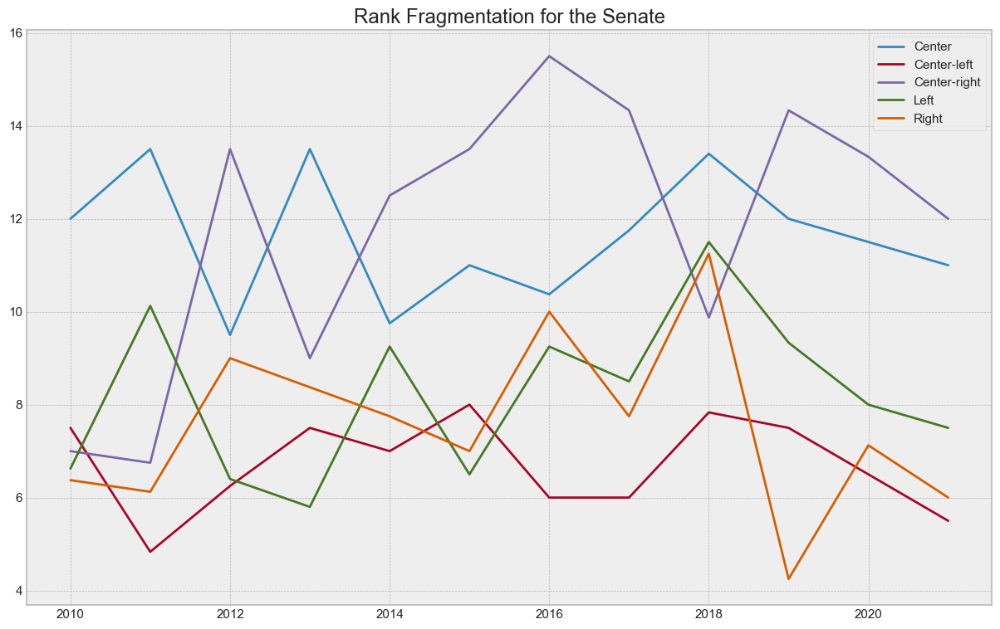

In [56]:
plt.figure(figsize=(15,9))
als = []
for alinhamento_ in chamber_ranking['alinhamento'].unique():
    if alinhamento_ == 'NA' or alinhamento_ is np.nan:
        continue
    aux = senate_ranking.groupby(['alinhamento', 'year'], as_index=False).agg({'rank_fragmentation': ['mean', 'median', 'std'], 'rank_isolation': ['mean', 'median', 'std']})
    aux = aux[aux['alinhamento'] == alinhamento_]
    
    plt.plot(aux['year'], aux[('rank_fragmentation', 'mean')])
    als.append(alinhamento_)
    
als = [x.capitalize() for x in als]
plt.legend(als)
plt.title('Rank Fragmentation for the Senate')

Text(0.5, 1.0, 'Rank Isolation for the Chamber of Deputies')

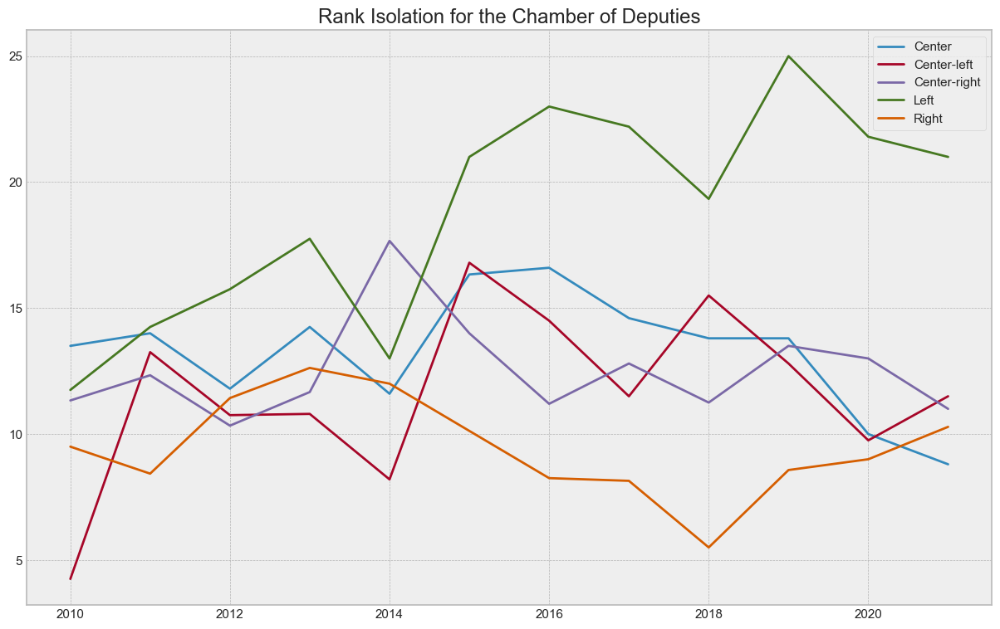

In [57]:
plt.figure(figsize=(15,9))
als = []
for alinhamento_ in chamber_ranking['alinhamento'].unique():
    if alinhamento_ == 'NA' or alinhamento_ is np.nan:
        continue
    aux = chamber_ranking.groupby(['alinhamento', 'year'], as_index=False).agg({'rank_fragmentation': ['mean', 'median', 'std'], 'rank_isolation': ['mean', 'median', 'std']})
    aux = aux[aux['alinhamento'] == alinhamento_]
    
    plt.plot(aux['year'], aux[('rank_isolation', 'mean')])
    als.append(alinhamento_)
    
als = [x.capitalize() for x in als]
plt.legend(als)
plt.title('Rank Isolation for the Chamber of Deputies')

Text(0.5, 1.0, 'Rank Isolation for the Senate')

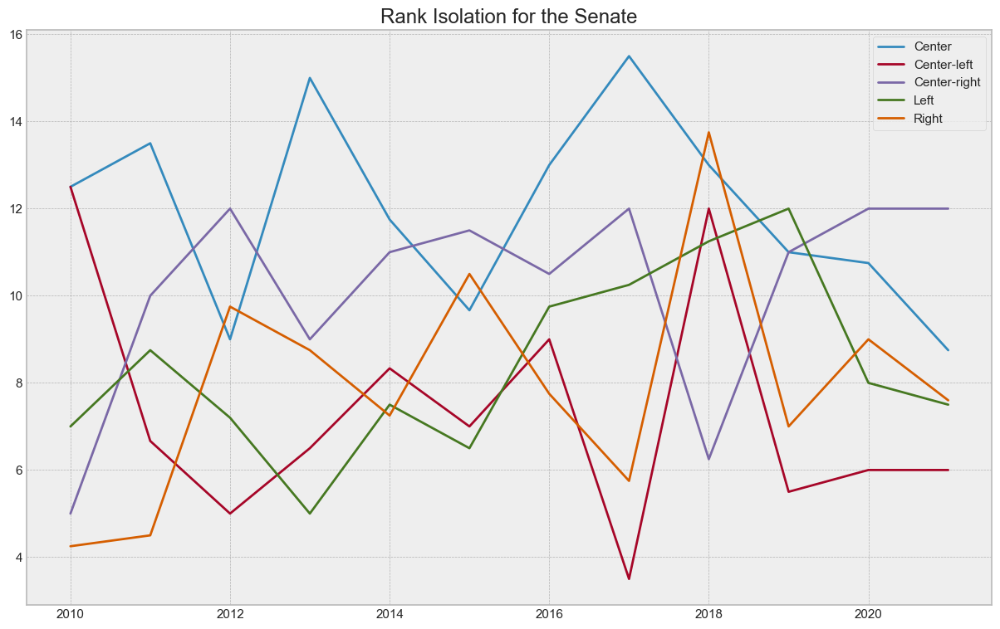

In [58]:
plt.figure(figsize=(15,9))
als = []
for alinhamento_ in chamber_ranking['alinhamento'].unique():
    if alinhamento_ == 'NA' or alinhamento_ is np.nan:
        continue
    aux = senate_ranking.groupby(['alinhamento', 'year'], as_index=False).agg({'rank_fragmentation': ['mean', 'median', 'std'], 'rank_isolation': ['mean', 'median', 'std']})
    aux = aux[aux['alinhamento'] == alinhamento_]
    
    plt.plot(aux['year'], aux[('rank_isolation', 'mean')])
    als.append(alinhamento_)
    
als = [x.capitalize() for x in als]
plt.legend(als)
plt.title('Rank Isolation for the Senate')

In [ ]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

house = 'chamber'

aux = df[df['house'] == house]

plt.plot(aux[aux['mse'] > 0]['mse'], aux[aux['mse'] > 0]['Surprise Surprise'], 'o')

pearsonr(aux[aux['mse'] > 0]['mse'], aux[aux['mse'] > 0]['Surprise Surprise'])